The Project
---

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import pickle
%matplotlib inline
%matplotlib qt

In [2]:
#找棋盘角，相机标定得到相机矩阵和失真系数

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
Chessboard_images = glob.glob('camera_cal/cal*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(Chessboard_images):
    chessboard_img = cv2.imread(fname)
    chessboard_gray = cv2.cvtColor(chessboard_img, cv2.COLOR_BGR2GRAY)
    img_size = (chessboard_img.shape[1], chessboard_img.shape[0])
    
    # Find the chessboard corners
    chessboard_ret, chessboard_corners = cv2.findChessboardCorners(chessboard_gray, (9,6), None)

    # If found, add object points, image points
    if chessboard_ret == True:
        objpoints.append(objp)
        imgpoints.append(chessboard_corners)
        print(fname + " test ok.")
        # Draw and display the corners
        cv2.drawChessboardCorners(chessboard_img, (9,6), chessboard_corners, chessboard_ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', chessboard_img)
        cv2.waitKey(500)
    else:
        print(fname + " 棋盘图像没有正确检测")
cv2.destroyAllWindows()

calibrate_ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)    
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )

camera_cal/calibration10.jpg test ok.
camera_cal/calibration18.jpg test ok.
camera_cal/calibration2.jpg test ok.
camera_cal/calibration14.jpg test ok.
camera_cal/calibration13.jpg test ok.
camera_cal/calibration15.jpg test ok.
camera_cal/calibration11.jpg test ok.
camera_cal/calibration7.jpg test ok.
camera_cal/calibration1.jpg 棋盘图像没有正确检测
camera_cal/calibration5.jpg 棋盘图像没有正确检测
camera_cal/calibration8.jpg test ok.
camera_cal/calibration19.jpg test ok.
camera_cal/calibration20.jpg test ok.
camera_cal/calibration16.jpg test ok.
camera_cal/calibration17.jpg test ok.
camera_cal/calibration6.jpg test ok.
camera_cal/calibration4.jpg 棋盘图像没有正确检测
camera_cal/calibration12.jpg test ok.
camera_cal/calibration9.jpg test ok.
camera_cal/calibration3.jpg test ok.


In [3]:
#矫正图像失真
# Test undistortion on an image

def img_undistort(img,mtx,dist):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst
''' 
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
print('mtx = ',mtx)
print('dist = ',dist)
print(img.shape)
dst = cv2.undistort(img, mtx, dist, None, mtx)
print(dst.shape)
cv2.imwrite('output_images/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
'''  

' \nimg = cv2.imread(\'camera_cal/calibration2.jpg\')\nimg_size = (img.shape[1], img.shape[0])\n\n# Do camera calibration given object points and image points\nret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)\nprint(\'mtx = \',mtx)\nprint(\'dist = \',dist)\nprint(img.shape)\ndst = cv2.undistort(img, mtx, dist, None, mtx)\nprint(dst.shape)\ncv2.imwrite(\'output_images/test_undist.jpg\',dst)\n\n# Save the camera calibration result for later use (we won\'t worry about rvecs / tvecs)\ndist_pickle = {}\ndist_pickle["mtx"] = mtx\ndist_pickle["dist"] = dist\npickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )\n#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)\n# Visualize undistortion\nf, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))\nax1.imshow(img)\nax1.set_title(\'Original Image\', fontsize=30)\nax2.imshow(dst)\nax2.set_title(\'Undistorted Image\', fontsize=30)\n'

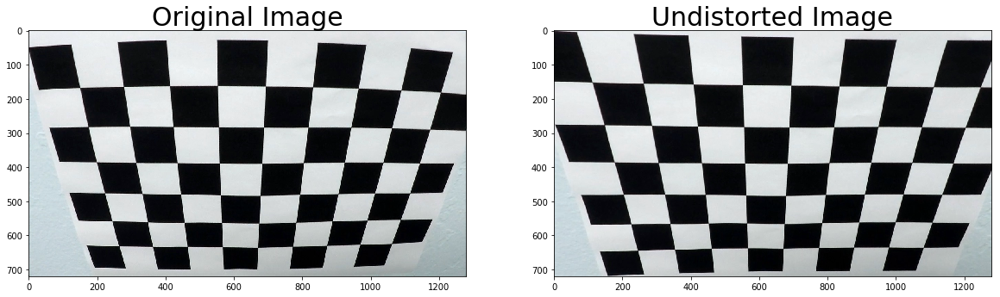

In [4]:
#测试-失真矫正
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
img = cv2.imread('camera_cal/calibration2.jpg')
dst_img = img_undistort(img,mtx,dist)
cv2.imwrite('output_images/test_undist.jpg',dst_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst_img)
ax2.set_title('Undistorted Image', fontsize=30)
plt.savefig('./writeup_images/image1.jpg')

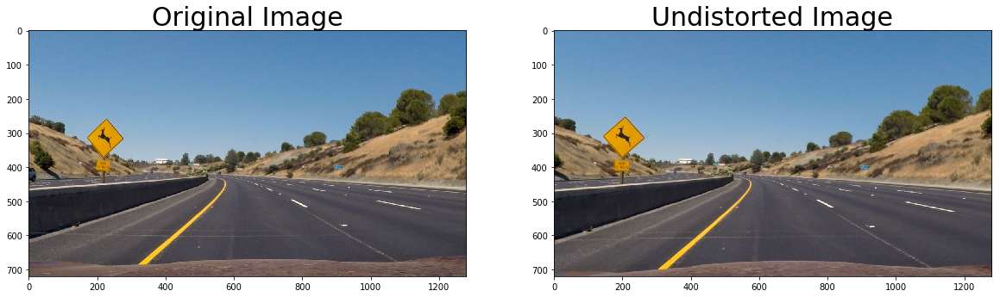

In [5]:
#测试-失真矫正
#img = cv2.imread('test_images/test1.jpg')
img_test= mpimg.imread('test_images/test2.jpg')
dst_test = img_undistort(img_test,mtx,dist)
'''
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
print(img.shape)
dst = cv2.undistort(img, mtx, dist, None, mtx)
print(dst.shape)
'''

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img_test)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst_test)
ax2.set_title('Undistorted Image', fontsize=30)
plt.savefig('./writeup_images/image2.jpg')

In [6]:
#将视频中的图像数据提取，进行畸变修正处理后，存储在名为original_image的文件夹中，以供挑选。
video_input = 'project_video.mp4'
cap = cv2.VideoCapture(video_input)
count = 1
while(True):
    ret, image = cap.read()
    if ret:
        undistort_image = img_undistort(image, mtx, dist)
        cv2.imwrite('original_image/' + str(count) + '.jpg', undistort_image)
        count += 1
    else:
        break
cap.release()

In [6]:
#透视变换，图像变成俯视视角
'''

# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
img1 = cv2.imread('camera_cal/calibration2.jpg')
#dist_pickle = pickle.load( open( "camera_cal/wide_dist_pickle.p", "rb" ) )
#mtx = dist_pickle["mtx"]
#dist = dist_pickle["dist"]
# Read in an image
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
# MODIFY THIS FUNCTION TO GENERATE OUTPUT 
# THAT LOOKS LIKE THE IMAGE ABOVE
def corners_unwarp(img, nx, ny, mtx_un, dist_un):
    undist_un = cv2.undistort(img, mtx_un, dist_un, None, mtx_un)
    gray_un = cv2.cvtColor(undist_un, cv2.COLOR_BGR2GRAY)
    ret_un, corners_un = cv2.findChessboardCorners(gray_un, (nx,ny), None)
    print(ret_un)
    if ret_un == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(undist_un, (nx,ny), corners_un, ret_un)
        img_size_un = (undist_un.shape[1],undist_un.shape[0])
        src_un = np.float32([corners_un[0],corners_un[nx-1],corners_un[-1],corners_un[-nx]])
        offset_un = 100
        dst_un = np.float32([[offset_un,offset_un],[img_size_un[0]-offset_un,offset_un],[img_size_un[0]-offset_un,img_size_un[1]-offset_un],[offset_un,img_size_un[1]-offset_un]])
        M_un = cv2.getPerspectiveTransform(src_un, dst_un)
        warped_un = cv2.warpPerspective(undist_un, M_un, img_size_un, flags=cv2.INTER_LINEAR)
    return warped_un
'''
#perspective_M= corners_unwarp(img1, nx, ny, mtx, dist)
'''
img1 = mpimg.imread('test_images/straight_lines1.jpg')
img_size = (img1.shape[1], img1.shape[0])
'''
def warper(img):
    img_size = (img.shape[1], img.shape[0])
    '''
    src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
    
    src = np.float32([[580, 460], [700, 460], [1096, 720], [200, 720]])
    dst = np.float32([[300, 0], [950, 0], [956, 720], [296, 720]])
    '''
    src = np.float32([[580, 460], [700, 460], [1096, 720], [200, 720]])
    dst = np.float32([[300, 0], [950, 0], [950, 720], [300, 720]])
    # Compute and apply perpective transform
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    #print(M)
    #print(Minv)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image
    return warped,Minv
'''
distort_image = undistortImage(test_distort_image, mtx, dist)
top_down_warped = warper(img1,src,dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img1)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_warped)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
'''

"\ndistort_image = undistortImage(test_distort_image, mtx, dist)\ntop_down_warped = warper(img1,src,dst)\n\nf, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))\nf.tight_layout()\nax1.imshow(img1)\nax1.set_title('Original Image', fontsize=50)\nax2.imshow(top_down_warped)\nax2.set_title('Undistorted and Warped Image', fontsize=50)\nplt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)\n"

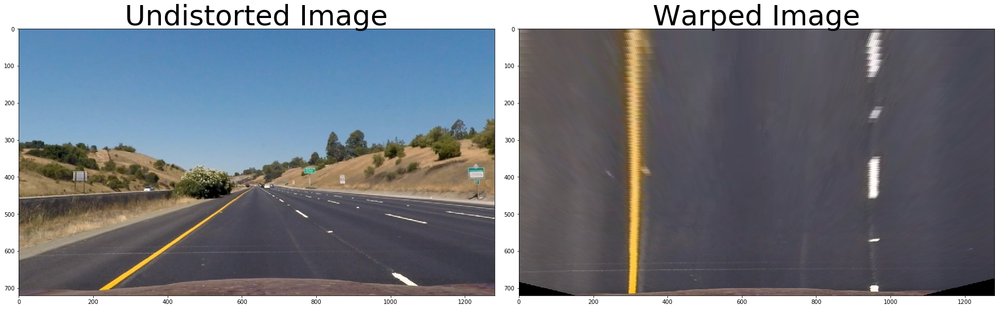

In [16]:
#测试-透视变换（对原始直道图像）
test_img1 = mpimg.imread('test_images/straight_lines1.jpg')
test_distort_image1 = img_undistort(test_img1,mtx,dist)
test_top_down_warped1,test_Minv1 = warper(test_distort_image1)
'''
img_size = (img1.shape[1], img1.shape[0])
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_distort_image1)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(test_top_down_warped1)
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./writeup_images/image3.jpg')

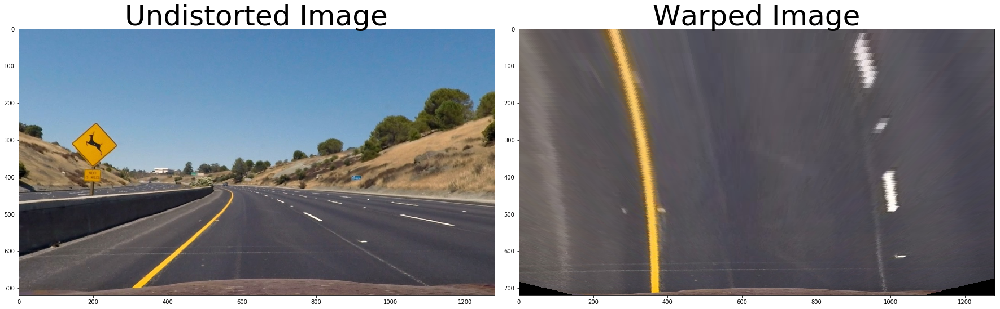

In [17]:
#测试-透视变换(对已经失真矫正图像)
top_down_warped_test,Minv_test = warper(dst_test)
#cv2.imwrite('output_images/top_down_warped.jpg',top_down_warped4)

#img_size = (img1.shape[1], img1.shape[0])

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dst_test)
ax1.set_title('Undistorted Image', fontsize=50)
ax2.imshow(top_down_warped_test)
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./writeup_images/image4.jpg')

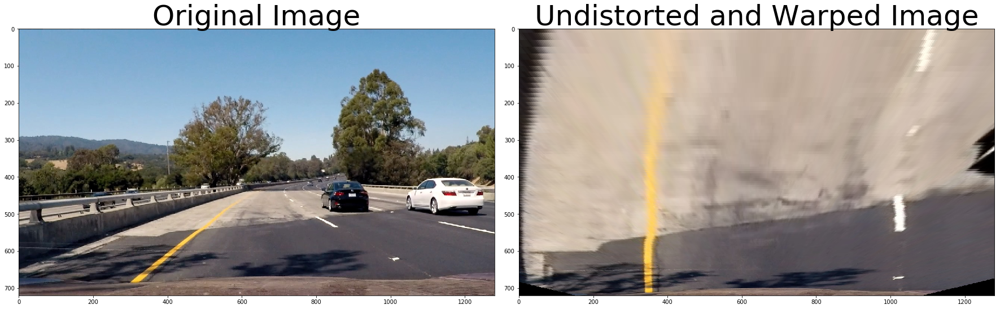

In [9]:
#测试1-透视变换（对原始图像）
img1 = mpimg.imread('test_images/test4.jpg')
distort_image1 = img_undistort(img1,mtx,dist)
top_down_warped1,Minv1 = warper(distort_image1)
'''
img_size = (img1.shape[1], img1.shape[0])
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img1)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_warped1)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

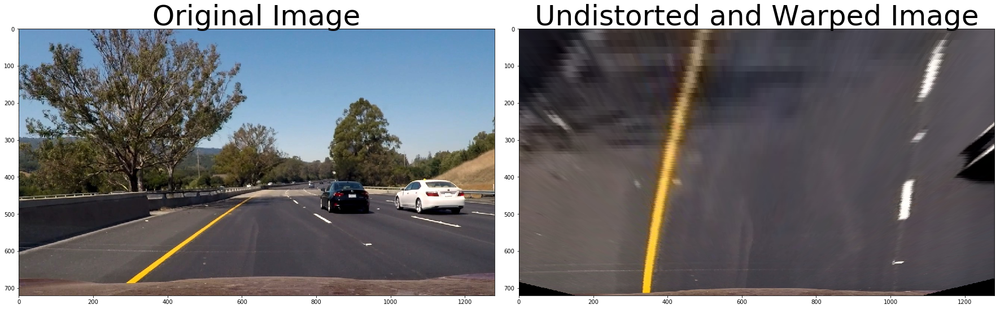

In [10]:
#测试2-透视变换（对原始图像）
img2 = mpimg.imread('test_images/test6.jpg')
distort_image2 = img_undistort(img2,mtx,dist)
top_down_warped2,Minv2 = warper(distort_image2)
'''
img_size = (img1.shape[1], img1.shape[0])
'''
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img2)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_warped2)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

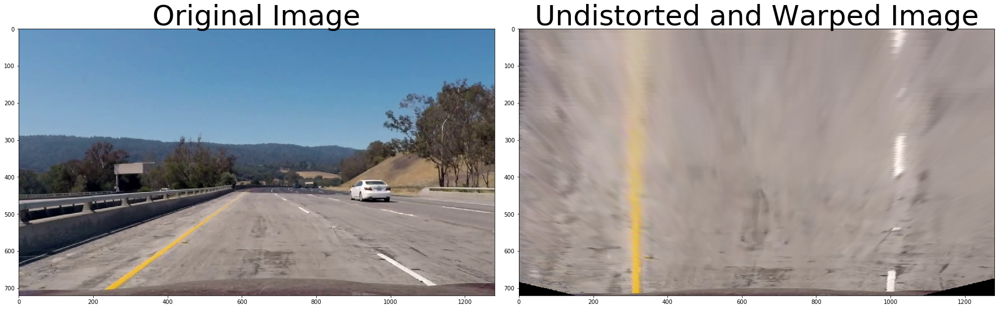

In [11]:
#测试3-透视变换（对已经失真矫正图像）
dst_img3 = mpimg.imread('original_image/575.jpg')
top_down_warped3,Minv3 = warper(dst_img3 )
#cv2.imwrite('output_images/top_down_warped.jpg',top_down_warped4)

#img_size = (img1.shape[1], img1.shape[0])

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dst_img3)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_warped3)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

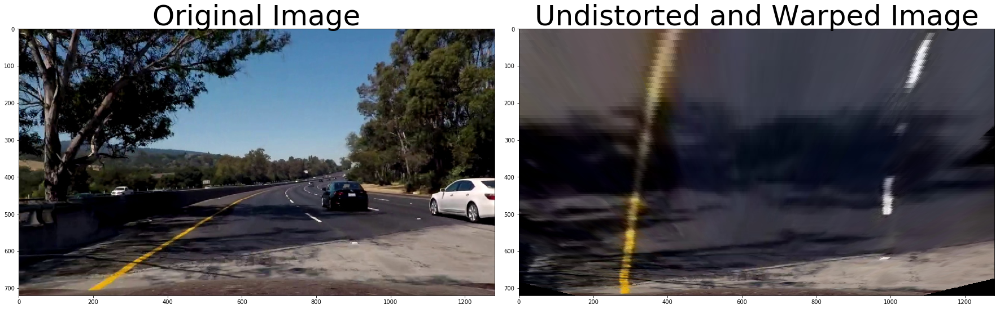

In [12]:
#测试4-透视变换（对已经失真矫正，并通过色彩和渐变空间输出的二值化图像）
dst_img4 = mpimg.imread('original_image/1038.jpg')
top_down_warped4,Minv4 = warper(dst_img4)
#cv2.imwrite('output_images/top_down_warped.jpg',top_down_warped2)

#img_size = (img1.shape[1], img1.shape[0])

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dst_img4)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_warped4)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

'\ncurvature=1000.2324\ndirection = \'Left\'\noffset = 0.124\ninfo_cur = "Curvature {:6.1f} m".format(curvature)\ninfo_offset = "Off center: {0} {1:3.3f}m".format(direction, offset)\ncv2.putText(dst_img5,info_cur,(400,50),cv2.FONT_HERSHEY_PLAIN,2.0,(0,0,255),2)\ncv2.putText(dst_img5,info_offset,(400,150),cv2.FONT_HERSHEY_PLAIN,2.0,(0,0,255),2)\nplt.imshow(dst_img5)\n'

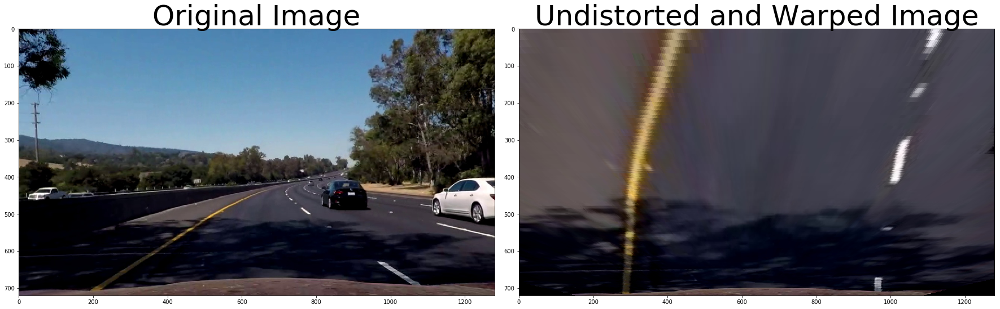

In [13]:
#测试5-透视变换#（对已经失真矫正，并通过色彩和渐变空间输出的二值化图像）
dst_img5 = mpimg.imread('original_image/1047.jpg')
top_down_warped5,Minv5 = warper(dst_img5)
#cv2.imwrite('output_images/top_down_warped.jpg',top_down_warped2)

#img_size = (img1.shape[1], img1.shape[0])

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dst_img5)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_warped5)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

'''
curvature=1000.2324
direction = 'Left'
offset = 0.124
info_cur = "Curvature {:6.1f} m".format(curvature)
info_offset = "Off center: {0} {1:3.3f}m".format(direction, offset)
cv2.putText(dst_img5,info_cur,(400,50),cv2.FONT_HERSHEY_PLAIN,2.0,(0,0,255),2)
cv2.putText(dst_img5,info_offset,(400,150),cv2.FONT_HERSHEY_PLAIN,2.0,(0,0,255),2)
plt.imshow(dst_img5)
'''

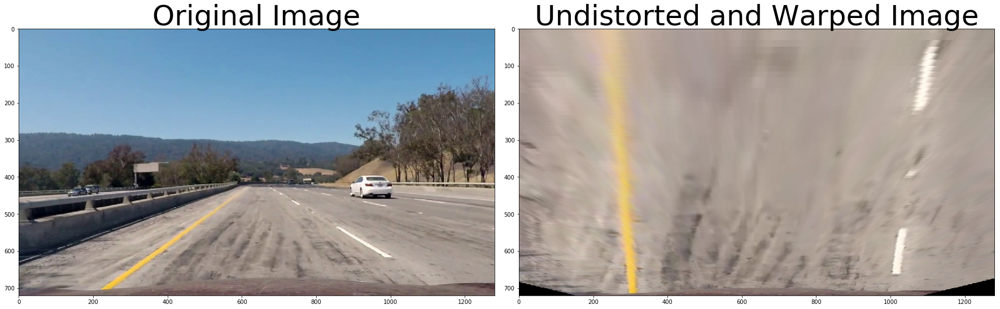

In [14]:
#测试6-透视变换#（对已经失真矫正，并通过色彩和渐变空间输出的二值化图像）
dst_img6 = mpimg.imread('original_image/560.jpg')
top_down_warped6,Minv6 = warper(dst_img6)
#cv2.imwrite('output_images/top_down_warped.jpg',top_down_warped2)

#img_size = (img1.shape[1], img1.shape[0])

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(dst_img6)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down_warped6)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [15]:
#渐变和色彩空间,输出二值化图像

def abs_sobel_thresh(img,orient,sxy_thresh):
     
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=3) # Take the derivative in x
    if orient == 'y':
        sobel = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=3) # Take the derivative in y
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sxybinary = np.zeros_like(scaled_sobel)
    sxybinary[(scaled_sobel >= sxy_thresh[0]) & (scaled_sobel <= sxy_thresh[1])] = 1
    binary_output = sxybinary
    return binary_output

def mag_thresh(img, sobel_kernel, mag_thresh):
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*magnitude/np.max(magnitude))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    binary_output = sxbinary
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely),np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir>= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

# Edit this function to create your own pipeline.
def pipeline(img, r_thresh=(230, 255), l_thresh=(210,255),s_thresh=(120,255),b_lab_thresh=(220,255),sxy_thresh=(45, 100)):#170, 255

    #RGB
    r_rgb = img[:,:,0]
    r_binary = np.zeros_like(r_rgb)
    r_binary[(r_rgb >= r_thresh[0]) & (r_rgb <= r_thresh[1])] = 1
    
    # HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    #Lab
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    b_lab = lab[:,:,2]
    if np.max(b_lab) > 100:
        b_lab = b_lab*(255/np.max(b_lab))
    b_binary = np.zeros_like(b_lab)
    b_binary[((b_lab > b_lab_thresh[0]) & (b_lab <= b_lab_thresh[1]))] = 1
    
    '''
    # Sobel x
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=3) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))   
    #Sobel
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    '''
    
    sxbinary=abs_sobel_thresh(img,'x',sxy_thresh)
    dir_binary = dir_threshold(img, sobel_kernel=3, thresh=(0.7, 1.3))
    
    # Stack each channel
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    color_binary = np.dstack((r_binary, sxbinary, l_binary)) * 255
   # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary==1)&(dir_binary==1)|(r_binary == 1)|(l_binary == 1)|(sxbinary == 1)] = 1#(b_binary == 1)
    return color_binary,combined_binary


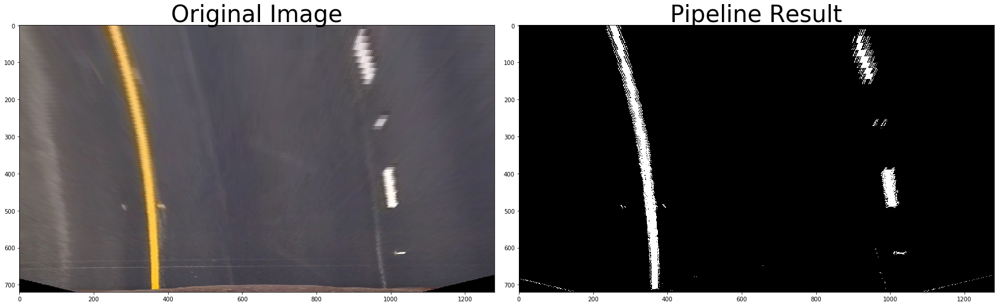

In [18]:
#测试-渐变和色彩空间,输出二值化图像
color_result_test,combined_binary_test = pipeline(top_down_warped_test)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(top_down_warped_test)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined_binary_test,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./writeup_images/image5.jpg')

Text(0.5, 1.0, 'Pipeline Result')

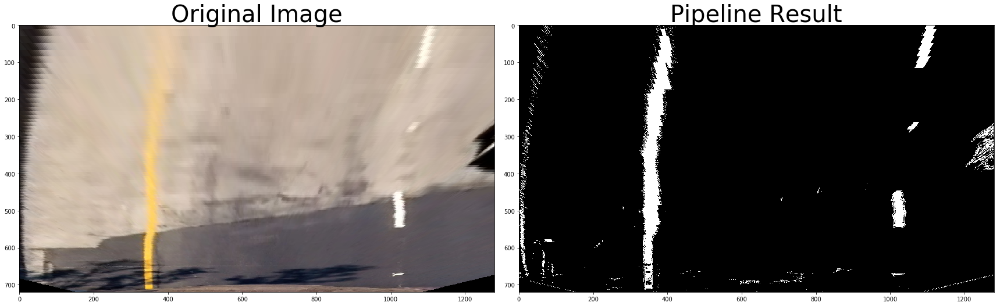

In [19]:
#测试1-渐变和色彩空间,输出二值化图像
color_result1,combined_binary1 = pipeline(top_down_warped1)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(top_down_warped1)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined_binary1,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Text(0.5, 1.0, 'Pipeline Result')

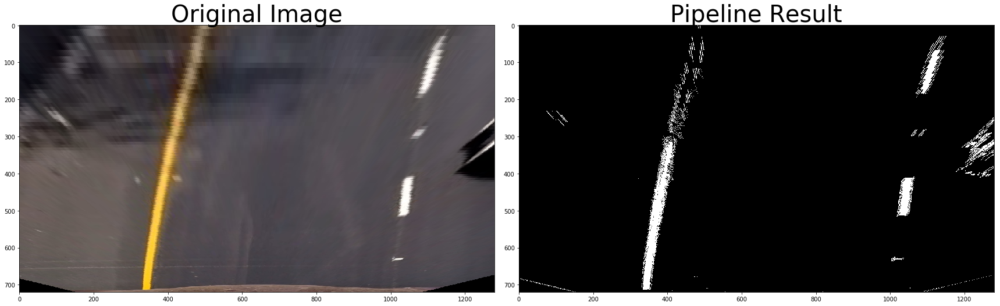

In [20]:
#测试2-渐变和色彩空间,输出二值化图像
color_result2,combined_binary2= pipeline(top_down_warped2)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(top_down_warped2)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined_binary2,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)

Text(0.5, 1.0, 'Pipeline Result')

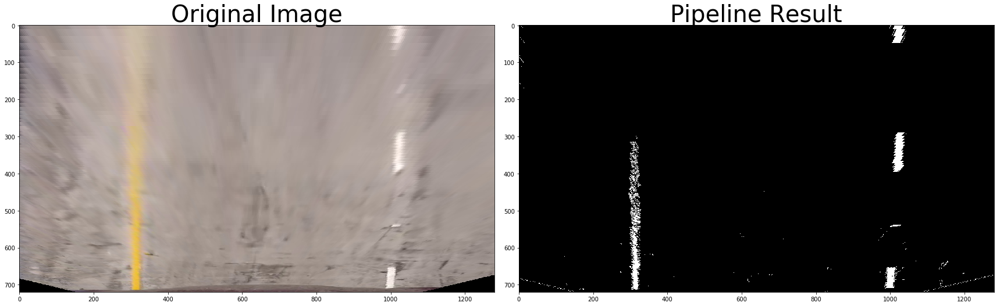

In [21]:
#测试3-渐变和色彩空间,输出二值化图像
color_result3,combined_binary3 = pipeline(top_down_warped3)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(top_down_warped3)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined_binary3,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)

Text(0.5, 1.0, 'Pipeline Result')

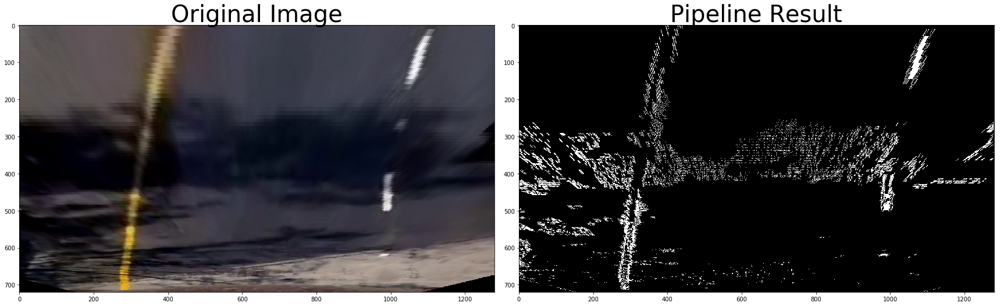

In [22]:
#测试4-渐变和色彩空间,输出二值化图像
color_result4,combined_binary4 = pipeline(top_down_warped4)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(top_down_warped4)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined_binary4,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)

Text(0.5, 1.0, 'Pipeline Result')

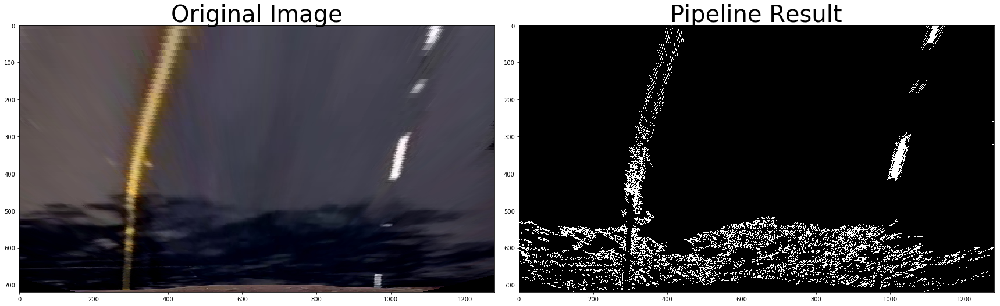

In [23]:
#测试5-渐变和色彩空间,输出二值化图像
color_result5,combined_binary5 = pipeline(top_down_warped5)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(top_down_warped5)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined_binary5,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)

Text(0.5, 1.0, 'Pipeline Result')

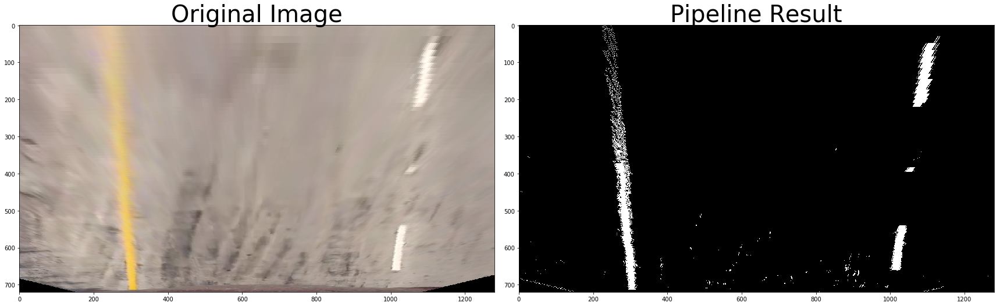

In [24]:
#测试6-渐变和色彩空间,输出二值化图像
color_result6,combined_binary6 = pipeline(top_down_warped6)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(top_down_warped6)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(combined_binary6,cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)

In [25]:
#单帧图像中车道线检测

def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #plt.imshow(out_img)
    #plt.imshow(binary_warped,cmap='gray')
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 60
    # Set minimum number of pixels found to recenter window
    minpix = 40

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    #print(nonzerox.shape)
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        #print('(',win_xleft_low,',',win_y_low,')',' (',win_xleft_high,',',win_y_high,')')
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) &(nonzeroy < win_y_high)
        & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    if len(leftx) == 0:
        print('leftx:0')
    if len(lefty) == 0:
        print('lefty:0')
    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    print(left_fit)
    print(right_fit)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return left_fit,right_fit,leftx,lefty,rightx,righty,left_fitx, right_fitx, ploty,out_img


[-2.26772384e-04  3.19644066e-01  2.52819093e+02]
[-1.70377536e-04  2.81282616e-01  9.07650921e+02]
[-2.26772384e-04  3.19644066e-01  2.52819093e+02]
[-1.70377536e-04  2.81282616e-01  9.07650921e+02]


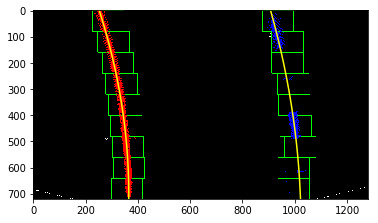

In [27]:
#测试-单帧图像中车道线检测
# Load our image
binary_warped_test = combined_binary_test

left_fit,right_fit,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx, ploty, result = fit_polynomial(binary_warped_test)
print(left_fit)
print(right_fit)
plt.imshow(result)
plt.savefig('./writeup_images/image6.jpg')

In [28]:
#两帧图像中车道线检测

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*(ploty**2) + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*(ploty**2) + right_fit[1]*ploty + right_fit[2]
    return left_fit, right_fit, left_fitx, right_fitx, ploty

def search_around_poly(left_fit,right_fit,binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 60

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin))
        & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin))
        & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    print(left_fit)
    print(right_fit)
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return left_fit,right_fit,leftx,lefty,rightx,righty,left_fitx, right_fitx, ploty, result



[-2.26772384e-04  3.19644066e-01  2.52819093e+02]
[-1.70377536e-04  2.81282616e-01  9.07650921e+02]
[-2.26772384e-04  3.19644066e-01  2.52819093e+02]
[-1.70990391e-04  2.82888937e-01  9.07046940e+02]
[-2.26772384e-04  3.19644066e-01  2.52819093e+02]
[-1.70990391e-04  2.82888937e-01  9.07046940e+02]


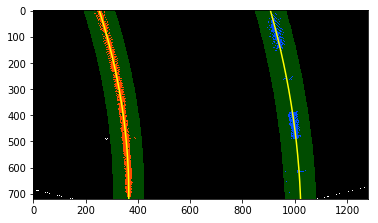

In [29]:
#测试-两帧图像中车道线检测

#Load our image - this should be a new frame since last time!
binary_warped_img = combined_binary_test

# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!
print(left_fit)
print(right_fit)

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
left_fit, right_fit, warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx, ploty,result = search_around_poly(left_fit, right_fit, binary_warped_img)
print(left_fit)
print(right_fit)
# View your output
plt.imshow(result)
plt.savefig('./writeup_images/image7.jpg')

In [30]:
#车道线曲率和当前测偏距离计算
#x_in_meter= mx / (my**2) *a(y_in_meter**2)+(mx/my)b*y_in_meter+mx*c
#x=ay**2+by+c, mx=x_in_meter/mx, my=y_in_meter/my
   
def measure_curvature_real():
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    #left_fit_cr = np.polyfit(warped_lefty*ym_per_pix, warped_leftx*xm_per_pix, 2)
    #right_fit_cr = np.polyfit(warped_righty*ym_per_pix, warped_rightx*xm_per_pix, 2)
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    #ploty = np.linspace(0, binary_warped_img.shape[0]-1, binary_warped_img.shape[0])
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = (1+(2*left_fit_cr[0]*y_eval*ym_per_pix+left_fit_cr[1])**2)**1.5/np.absolute(2*left_fit_cr[0])  ## Implement the calculation of the left line here
    right_curverad = (1+(2*right_fit_cr[0]*y_eval*ym_per_pix+right_fit_cr[1])**2)**1.5/np.absolute(2*right_fit_cr[0])  ## Implement the calculation of the right line here
    curve_direction = (left_curverad+right_curverad)/2.0
    
    #left_down_realx = left_fit_cr[0]*((y_eval*ym_per_pix)**2)+left_fit_cr[1]*(y_eval*ym_per_pix)+left_fit_cr[2]
    #right_down_realx =right_fit_cr[0]*((y_eval*ym_per_pix)**2)+right_fit_cr[1]*(y_eval*ym_per_pix)+right_fit_cr[2]
    #distance_from_center = (right_down_realx - left_down_realx)/2 - (binary_warped_img.shape[1]/2)*xm_per_pix
    lane_width = np.absolute(left_fitx[-1] - right_fitx[-1])
    lane_xm_per_pix=3.7/lane_width
    veh_pos = (((left_fitx[719] + right_fitx[719]) * lane_xm_per_pix) / 2.)
    cen_pos = ((binary_warped_img.shape[1] * lane_xm_per_pix) / 2.)
    distance_from_center = veh_pos - cen_pos
    
    return left_curverad, right_curverad, curve_direction, distance_from_center



In [31]:
#测试-车道线曲率和当前测偏距离计算
# Calculate the radius of curvature in meters for both lane lines
left_curverad, right_curverad , curve_direction, distance_real = measure_curvature_real()

print(left_curverad, 'm', right_curverad, 'm')
print("车道曲率为：",curve_direction,'m')
print("车辆相对于车道中心的真实位置：",distance_real,'m')
# Should see values of 533.75 and 648.16 here, if using
# the default `generate_data` function with given seed number

724.1926421538909 m 960.4759318338192 m
车道曲率为： 842.3342869938551 m
车辆相对于车道中心的真实位置： 0.3027542123037241 m


In [32]:
# 将检测到的车道边界扭曲回原始图像
def drawing(undist, bin_warped,Minv, left_fitx, right_fitx, ploty):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(bin_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    line_img = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return line_img

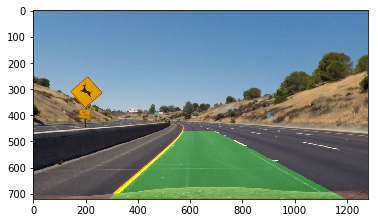

In [33]:
#测试-将检测到的车道边界扭曲回原始图像
draw_result = drawing(dst_test , combined_binary_test,Minv_test, left_fitx, right_fitx, ploty)
plt.imshow(draw_result)
plt.savefig('./writeup_images/image8.jpg')

In [34]:
#视频上显示实时文字(车道线曲率和当前测偏距离)
def putimg(line_img, curvature, offset):
    info_cur="Curvature: {:6.3f} m".format(curvature)
    #info_offset = "Off center: {0} {1:3.3f}m".format(direction, offset)
    info_offset = "Off center: {:3.3f}m".format(offset)
    cv2.putText(line_img,info_cur,(100,50),cv2.FONT_HERSHEY_PLAIN,2.0,(255,255,0),2)
    cv2.putText(line_img,info_offset,(100,150),cv2.FONT_HERSHEY_PLAIN,2.0,(255,255,0),2)
    result = line_img
    return result

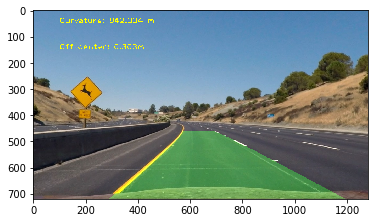

In [35]:
output_result=putimg(draw_result, curve_direction, distance_real)
plt.imshow(output_result)
plt.savefig('./writeup_images/image9.jpg')

In [36]:
'''
undistort_image = img_undistort(image, mtx, dist)
top_down_warped,Minv = warper(undistort_image)
color_result_img,combined_binary_img = pipeline(top_down_warped)
left_fit,right_fit,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = fit_polynomial(combined_binary_img)
draw_result = drawing(undistort_image , combined_binary_img,Minv, left_fitx, right_fitx, ploty)
'''

'\nundistort_image = img_undistort(image, mtx, dist)\ntop_down_warped,Minv = warper(undistort_image)\ncolor_result_img,combined_binary_img = pipeline(top_down_warped)\nleft_fit,right_fit,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = fit_polynomial(combined_binary_img)\ndraw_result = drawing(undistort_image , combined_binary_img,Minv, left_fitx, right_fitx, ploty)\n'

1
[-2.28047868e-04  3.09390436e-01  2.54971313e+02]
[-1.83976516e-04  2.84815326e-01  9.14452760e+02]
k
2
[-2.36121500e-04  3.18984568e-01  2.53531290e+02]
[-1.49111260e-04  2.65374842e-01  9.12249326e+02]
l
3
[-2.49656812e-04  3.33074921e-01  2.51039476e+02]
[-2.32513192e-04  3.46853764e-01  8.92412856e+02]
l
4
[-2.54730724e-04  3.40244275e-01  2.49480073e+02]
[-2.41672418e-04  3.67972266e-01  8.82930677e+02]
l
5
[-2.73120841e-04  3.57741202e-01  2.45954617e+02]
[-2.30293146e-04  3.59973113e-01  8.83592589e+02]
l
6
[-2.72179440e-04  3.62091538e-01  2.44396821e+02]
[-2.05381065e-04  3.46355282e-01  8.81029443e+02]
l
7
[-2.49972063e-04  3.51233461e-01  2.43341703e+02]
[-1.93068292e-04  3.32648272e-01  8.85511872e+02]
l
8
[-2.49245798e-04  3.55561411e-01  2.42010446e+02]
[-9.92411264e-05  2.94900717e-01  8.80824685e+02]
l
9
[-2.44202909e-04  3.55379405e-01  2.39376717e+02]
[-4.01747193e-05  2.47741961e-01  8.90681183e+02]
l
10
[-2.34611716e-04  3.53265693e-01  2.36415004e+02]
[-5.7429826

[-8.95405471e-05  2.24582167e-01  2.23182633e+02]
[-2.35552861e-04  3.59611019e-01  8.52971862e+02]
l
82
[-8.51855667e-05  2.18711486e-01  2.23023318e+02]
[-2.18553866e-04  3.39232941e-01  8.58905972e+02]
l
83
[-9.82177797e-05  2.23806708e-01  2.22528746e+02]
[-2.01614471e-04  3.27479207e-01  8.61032895e+02]
l
84
[-8.81811216e-05  2.17946874e-01  2.18543022e+02]
[-1.45000107e-04  2.78078693e-01  8.78439293e+02]
l
85
[-9.89549764e-05  2.20780305e-01  2.20307993e+02]
[-1.33514116e-04  2.71324617e-01  8.78608566e+02]
l
86
[-1.12907493e-04  2.25559768e-01  2.22139859e+02]
[-1.21140691e-04  2.57254632e-01  8.81240979e+02]
l
87
[-1.42476488e-04  2.36103777e-01  2.29748469e+02]
[-1.52333961e-04  3.00441436e-01  8.61586976e+02]
l
88
[-1.60325366e-04  2.43380230e-01  2.34116598e+02]
[-8.76361659e-05  2.62699872e-01  8.59037544e+02]
l
89
[-1.87414440e-04  2.59496912e-01  2.35812530e+02]
[-1.45309611e-04  3.08723121e-01  8.48241828e+02]
l
90
[-2.09750671e-04  2.71618232e-01  2.40228067e+02]
[-2.2

159
[-2.07781541e-04  3.05943904e-01  2.38313751e+02]
[-1.76019177e-04  3.46090567e-01  8.58130183e+02]
l
160
[-2.12893493e-04  3.09915580e-01  2.37485883e+02]
[-1.48431457e-04  3.34685302e-01  8.53209135e+02]
l
161
[-2.14794511e-04  3.18260750e-01  2.31670921e+02]
[-1.70106164e-04  3.34966219e-01  8.61176614e+02]
l
162
[-2.12116609e-04  3.18778065e-01  2.28886541e+02]
[-1.28073451e-04  3.04023404e-01  8.66154577e+02]
l
163
[-2.17416778e-04  3.28818027e-01  2.23421800e+02]
[-1.39859989e-04  3.01833703e-01  8.72490682e+02]
l
164
[-2.20214556e-04  3.30384702e-01  2.24078343e+02]
[-8.63140293e-05  2.70888657e-01  8.69756653e+02]
l
165
[-2.32267443e-04  3.37671262e-01  2.25390713e+02]
[-2.18617460e-04  3.91940681e-01  8.38622688e+02]
l
166
[-2.23687700e-04  3.35433069e-01  2.22489505e+02]
[-1.95541130e-04  3.69930792e-01  8.43554947e+02]
l
167
[-2.34829416e-04  3.42075307e-01  2.23010164e+02]
[-2.03621333e-04  3.89879170e-01  8.32155656e+02]
l
168
[-2.07189951e-04  3.29571592e-01  2.185625

238
[-2.03924276e-04  3.36566065e-01  1.84638082e+02]
[-3.44879527e-04  5.02201988e-01  7.86082434e+02]
l
239
[-2.04303161e-04  3.31466236e-01  1.87184300e+02]
[-3.32081950e-04  5.03064447e-01  7.80523471e+02]
l
240
[-2.03085867e-04  3.28934929e-01  1.87257183e+02]
[-3.13447454e-04  4.88483067e-01  7.84353783e+02]
l
241
[-2.19023701e-04  3.40237168e-01  1.85557115e+02]
[-2.96056736e-04  4.72293991e-01  7.87130003e+02]
l
242
[-2.18812004e-04  3.42744645e-01  1.81170383e+02]
[-2.72731057e-04  4.38962682e-01  8.01878329e+02]
l
243
[-2.38190875e-04  3.51909171e-01  1.84186088e+02]
[-2.75750964e-04  4.59186577e-01  7.88563207e+02]
l
244
[-2.38048168e-04  3.51840939e-01  1.82751938e+02]
[-2.66144757e-04  4.42612456e-01  7.94934704e+02]
l
245
[-2.30944198e-04  3.41072139e-01  1.86649886e+02]
[-2.58267075e-04  4.53571899e-01  7.84589317e+02]
l
246
[-2.33101073e-04  3.40478901e-01  1.88074698e+02]
[-2.35747651e-04  4.38585035e-01  7.83918010e+02]
l
247
[-2.30391656e-04  3.37678231e-01  1.873072

[-6.05090225e-05  6.26608893e-02  3.29000094e+02]
[-1.42288811e-05  1.02932548e-01  9.35179409e+02]
l
317
[-3.98674289e-05  4.82168936e-02  3.30674528e+02]
[7.61417385e-06 7.72387547e-02 9.45577816e+02]
l
318
[-1.21360713e-05  1.45529881e-02  3.44442908e+02]
[-3.51631860e-05  1.13474057e-01  9.33274638e+02]
l
319
[-7.15889511e-06  1.27115389e-02  3.43773085e+02]
[-6.18368898e-05  1.18056319e-01  9.40167775e+02]
l
320
[-6.44526731e-06  3.97730711e-03  3.50285470e+02]
[-1.19287404e-04  1.73717910e-01  9.26156674e+02]
l
321
[ 6.28169321e-06 -4.49979784e-03  3.50488174e+02]
[-1.11282764e-04  1.58607572e-01  9.34870277e+02]
l
322
[5.20152166e-07 9.11780108e-04 3.49345203e+02]
[-1.45739965e-04  1.83507861e-01  9.32755859e+02]
l
323
[ 8.84340727e-06 -7.37599665e-03  3.51993691e+02]
[-1.10491649e-04  1.56372311e-01  9.37332857e+02]
l
324
[2.92782429e-06 4.95598753e-03 3.44374489e+02]
[-1.04058625e-04  1.35792566e-01  9.51356137e+02]
l
325
[ 8.86962845e-06 -6.50193818e-03  3.49747642e+02]
[-9.1

l
395
[3.48018999e-06 7.79524756e-03 3.35066031e+02]
[2.84625903e-05 8.84432359e-04 9.85248230e+02]
l
396
[-1.60447853e-06  1.41399447e-02  3.32043263e+02]
[1.99347930e-05 6.12894710e-03 9.83747046e+02]
l
397
[-2.15564280e-05  3.41716479e-02  3.25378388e+02]
[6.90952345e-06 1.38147811e-02 9.85027528e+02]
l
398
[-5.24917685e-05  5.61861519e-02  3.22290216e+02]
[-3.20940088e-06  2.42223744e-02  9.81925888e+02]
l
399
[-6.39785680e-05  6.87919665e-02  3.17627976e+02]
[9.06426577e-06 7.70590893e-03 9.87866340e+02]
l
400
[-5.87326808e-05  6.42054797e-02  3.18731088e+02]
[1.59143512e-05 5.57726189e-03 9.85978166e+02]
l
401
[-5.60480863e-05  6.66471421e-02  3.15647696e+02]
[ 3.47943871e-05 -1.46640237e-02  9.91965893e+02]
l
402
[-5.49909072e-05  6.65442087e-02  3.14961798e+02]
[ 7.40377402e-05 -3.70354106e-02  9.94186134e+02]
l
403
[-3.88231677e-05  5.40006372e-02  3.18264242e+02]
[ 6.45990881e-05 -2.91153173e-02  9.88768575e+02]
l
404
[-2.81626929e-05  5.06400135e-02  3.14779656e+02]
[ 8.3933

473
[-3.95818081e-05  1.69681466e-02  3.22612216e+02]
[ 7.92781631e-05 -6.97898332e-02  9.83996495e+02]
l
474
[-1.97232162e-05 -6.61375422e-04  3.27498257e+02]
[ 5.48331233e-05 -5.36576508e-02  9.79982510e+02]
l
475
[-2.40508486e-05  1.53848010e-02  3.17098322e+02]
[ 5.86967509e-05 -7.26492988e-02  9.92955990e+02]
l
476
[-1.45583953e-06 -2.77774468e-03  3.21230532e+02]
[ 7.24958389e-05 -8.13902501e-02  9.93504807e+02]
l
477
[-4.48164213e-06  5.85632800e-03  3.15077685e+02]
[ 3.52682440e-05 -6.64442185e-02  9.99402483e+02]
l
478
[-1.03109756e-06  5.38486903e-03  3.13663746e+02]
[-1.26866923e-06 -4.29199596e-02  9.99813751e+02]
l
479
[7.61039636e-07 5.61326640e-03 3.12113882e+02]
[ 4.29131545e-06 -5.02658938e-02  1.00339333e+03]
l
480
[3.54224677e-06 9.34580911e-03 3.07063462e+02]
[ 1.39846132e-07 -5.30085857e-02  1.00975595e+03]
l
481
[ 1.16964220e-06 -1.66701117e-03  3.14904330e+02]
[ 4.97442111e-06 -5.17833358e-02  1.00698152e+03]
l
482
[ 1.18823114e-05 -2.20207957e-03  3.08753097e+02

552
[-2.35853641e-06  3.33831049e-02  2.96185598e+02]
[-1.11115338e-05 -6.49359671e-02  1.03790949e+03]
l
553
[-1.10671734e-06  3.01266764e-02  2.98220616e+02]
[ 3.17173867e-05 -9.46788051e-02  1.04246190e+03]
l
554
[-1.64999874e-05  4.48880909e-02  2.92957651e+02]
[ 4.67882655e-06 -8.42386470e-02  1.04386933e+03]
l
555
[4.20834646e-06 2.33505501e-02 3.00100490e+02]
[ 1.11850595e-06 -8.19643883e-02  1.04133528e+03]
l
556
[-3.67200412e-05  4.94305207e-02  3.01351672e+02]
[-1.04514480e-05 -6.27525884e-02  1.03114824e+03]
l
557
[-3.34697917e-05  3.99601033e-02  3.06714315e+02]
[-2.58765481e-05 -4.32429261e-02  1.02415214e+03]
l
558
[-5.63980548e-05  6.55228328e-02  2.96697378e+02]
[-2.00598535e-05 -5.13714844e-02  1.02957247e+03]
l
559
[-3.27072022e-05  6.68679250e-02  2.79253038e+02]
[-1.26833806e-05 -8.94794051e-02  1.06094248e+03]
l
560
[-1.23128079e-05  9.77082872e-02  2.41186384e+02]
[ 6.14484551e-06 -1.53521065e-01  1.11181389e+03]
l
561
[-2.72246973e-05  1.22943831e-01  2.26116012e

[ 1.73572645e-04 -3.52903655e-01  4.50346527e+02]
[ 1.39281620e-04 -3.11162109e-01  1.12990471e+03]
l
632
[ 1.41423640e-04 -3.07149393e-01  4.30149429e+02]
[ 1.28282462e-04 -3.12544798e-01  1.13845910e+03]
l
633
[ 1.24011058e-04 -2.88785487e-01  4.24352221e+02]
[ 1.36055965e-04 -3.16141807e-01  1.13714433e+03]
l
634
[ 1.39545239e-04 -3.20151510e-01  4.41574347e+02]
[ 1.50164280e-04 -3.12715806e-01  1.12538779e+03]
l
635
[ 1.38236962e-04 -3.54542579e-01  4.71019398e+02]
[ 1.42342363e-04 -2.81901566e-01  1.10196704e+03]
l
636
[ 1.39973685e-04 -3.88027094e-01  4.99283359e+02]
[ 2.01504003e-04 -3.12131078e-01  1.09279960e+03]
l
637
[ 1.67602209e-04 -4.49508433e-01  5.37223238e+02]
[ 2.43754534e-04 -3.28838915e-01  1.08116215e+03]
l
638
[ 1.30907361e-04 -4.14883211e-01  5.34012851e+02]
[ 2.38091122e-04 -3.28330754e-01  1.08372460e+03]
l
639
[ 9.41812322e-05 -3.53804405e-01  5.09973818e+02]
[ 2.25570061e-04 -3.27933884e-01  1.09312741e+03]
l
640
[ 8.08472210e-05 -3.02136670e-01  4.79331806e+

[ 1.43001095e-04 -3.10008062e-01  4.84976128e+02]
[ 1.97177748e-04 -2.69088421e-01  1.08236759e+03]
l
710
[ 1.48436389e-04 -3.12859338e-01  4.85176766e+02]
[ 1.99440656e-04 -2.72600907e-01  1.08259468e+03]
l
711
[ 1.56590044e-04 -3.18092605e-01  4.85503922e+02]
[ 2.00799872e-04 -2.77879560e-01  1.08531884e+03]
l
712
[ 1.42259128e-04 -2.98085538e-01  4.77526849e+02]
[ 2.01957870e-04 -2.82585844e-01  1.08791665e+03]
l
713
[ 1.43607098e-04 -2.98018054e-01  4.76581101e+02]
[ 2.03158026e-04 -2.91549888e-01  1.09257630e+03]
l
714
[ 1.19862978e-04 -2.79788116e-01  4.76347477e+02]
[ 2.06358643e-04 -2.90169275e-01  1.08898190e+03]
l
715
[ 1.15210775e-04 -2.80459557e-01  4.79814473e+02]
[ 2.01273439e-04 -2.87764242e-01  1.08791022e+03]
l
716
[ 1.57776400e-04 -3.20707145e-01  4.88900235e+02]
[ 2.13940445e-04 -2.95217385e-01  1.09023657e+03]
l
717
[ 1.44254309e-04 -3.03462015e-01  4.82675479e+02]
[ 2.17893519e-04 -3.07349890e-01  1.09758702e+03]
l
718
[ 1.33210840e-04 -2.88382044e-01  4.77113363e+

788
[ 1.64520480e-04 -2.97953349e-01  5.16298339e+02]
[ 2.60266141e-04 -3.07630217e-01  1.14473749e+03]
l
789
[ 1.56787565e-04 -2.95565716e-01  5.18802558e+02]
[ 3.25535403e-04 -3.47791819e-01  1.14538038e+03]
l
790
[ 1.47707229e-04 -2.86467991e-01  5.17208845e+02]
[ 2.56812551e-04 -3.09095232e-01  1.13984190e+03]
l
791
[ 1.50877832e-04 -2.85321899e-01  5.16096222e+02]
[ 2.32520436e-04 -2.97013009e-01  1.14063594e+03]
l
792
[ 1.37798372e-04 -2.66485064e-01  5.08341983e+02]
[ 2.21742503e-04 -2.94849873e-01  1.14240074e+03]
l
793
[ 1.35947031e-04 -2.69623897e-01  5.11478286e+02]
[ 2.40859945e-04 -3.10225274e-01  1.14209376e+03]
l
794
[ 1.35408619e-04 -2.66342497e-01  5.09791681e+02]
[ 1.32315576e-04 -2.18512787e-01  1.12392805e+03]
l
795
[ 1.08119296e-04 -2.45041619e-01  5.07323143e+02]
[ 1.36964635e-04 -2.18088802e-01  1.11879127e+03]
l
796
[ 1.03189322e-04 -2.39462951e-01  5.07099992e+02]
[ 1.42439940e-04 -2.13480356e-01  1.11233889e+03]
l
797
[ 9.32411398e-05 -2.25275777e-01  5.012867

l
866
[ 1.18385081e-04 -1.98374419e-01  3.95911515e+02]
[ 2.12160124e-04 -3.54862574e-01  1.13379790e+03]
l
867
[ 1.11322201e-04 -1.79823478e-01  3.85669112e+02]
[ 1.91656388e-04 -3.48239266e-01  1.13935501e+03]
l
868
[ 1.11444351e-04 -1.87744087e-01  3.90447463e+02]
[ 2.19728119e-04 -3.77496989e-01  1.14519249e+03]
l
869
[ 1.15964764e-04 -1.96451166e-01  3.96382317e+02]
[ 1.72139439e-04 -3.27205413e-01  1.13183347e+03]
l
870
[ 9.68884611e-05 -1.86030499e-01  3.95517333e+02]
[ 1.72412669e-04 -3.36479173e-01  1.13721063e+03]
l
871
[ 1.15527549e-04 -2.01429700e-01  3.99546403e+02]
[ 1.51817806e-04 -3.28555786e-01  1.13721027e+03]
l
872
[ 1.10453942e-04 -1.85494115e-01  3.90491325e+02]
[ 1.59364280e-04 -3.35741480e-01  1.14339045e+03]
l
873
[ 8.19762767e-05 -1.67181044e-01  3.88725483e+02]
[ 1.68389859e-04 -3.45259720e-01  1.14574942e+03]
l
874
[ 8.63205035e-05 -1.59598089e-01  3.81773724e+02]
[ 1.79770704e-04 -3.58083110e-01  1.15197593e+03]
l
875
[ 1.20738495e-04 -1.89104268e-01  3.8788

[ 1.66540289e-04 -2.73311121e-01  4.37126088e+02]
[ 2.48682153e-04 -3.91535900e-01  1.14563570e+03]
l
945
[ 1.82426829e-04 -2.96062667e-01  4.46446398e+02]
[ 2.48153060e-04 -3.92226229e-01  1.14345699e+03]
l
946
[ 1.66987245e-04 -2.82246152e-01  4.43999164e+02]
[ 1.99530562e-04 -3.60096463e-01  1.14125587e+03]
l
947
[ 1.68932207e-04 -2.79546817e-01  4.39748486e+02]
[ 2.04513712e-04 -3.70039227e-01  1.14784877e+03]
l
948
[ 1.58346751e-04 -2.80484397e-01  4.46119406e+02]
[ 1.96893481e-04 -3.59394921e-01  1.14313178e+03]
l
949
[ 1.53303936e-04 -2.73924916e-01  4.42196762e+02]
[ 1.93249810e-04 -3.63065922e-01  1.14890695e+03]
l
950
[ 1.58163983e-04 -2.82388941e-01  4.45263381e+02]
[ 1.46081453e-04 -3.19101853e-01  1.14025488e+03]
l
951
[ 1.29514783e-04 -2.56612972e-01  4.39075412e+02]
[ 1.46840619e-04 -3.23555466e-01  1.14386842e+03]
l
952
[ 1.14637724e-04 -2.32537552e-01  4.26949361e+02]
[ 1.38239828e-04 -3.25585824e-01  1.15206711e+03]
l
953
[ 1.07833058e-04 -2.41854115e-01  4.37114521e+

1022
[ 1.61519585e-04 -1.82474694e-01  3.41759467e+02]
[ 1.57469304e-04 -3.07566110e-01  1.12177485e+03]
l
1023
[ 1.48811416e-04 -1.69792490e-01  3.31632011e+02]
[ 1.44008133e-04 -3.05648682e-01  1.12768325e+03]
l
1024
[ 1.54475774e-04 -1.71564145e-01  3.26918657e+02]
[ 1.29522977e-04 -2.93675339e-01  1.12722832e+03]
l
1025
[ 1.05909058e-04 -1.17124261e-01  3.08345133e+02]
[ 1.59612035e-04 -3.27428182e-01  1.13844366e+03]
l
1026
[ 1.49569416e-04 -1.81385134e-01  3.35141801e+02]
[ 1.03045559e-04 -2.42168059e-01  1.10309489e+03]
l
1027
[ 1.30613031e-04 -1.84402290e-01  3.45624042e+02]
[ 1.44623670e-04 -2.54513288e-01  1.09389597e+03]
l
1028
[ 1.12659700e-04 -1.86201427e-01  3.56525788e+02]
[ 2.08103816e-04 -2.90343344e-01  1.09131217e+03]
l
1029
[ 1.66678008e-04 -2.23734432e-01  3.61562678e+02]
[ 1.29224243e-04 -2.31551937e-01  1.07885246e+03]
l
1030
[ 2.67272219e-04 -3.20149826e-01  3.79516157e+02]
[ 5.24995327e-05 -1.75349535e-01  1.07267395e+03]
l
1031
[ 2.40799046e-04 -3.30245217e-01

[ 5.88139621e-05 -1.80674475e-01  4.41114615e+02]
[ 1.55676495e-04 -3.05480894e-01  1.13880507e+03]
l
1100
[ 5.00795160e-05 -1.73261725e-01  4.42051858e+02]
[ 7.60702245e-05 -2.40763176e-01  1.12852356e+03]
l
1101
[ 2.94362563e-05 -1.56969577e-01  4.41958274e+02]
[ 8.07281494e-05 -2.36867836e-01  1.12621345e+03]
l
1102
[ 1.89397740e-05 -1.20731451e-01  4.20518204e+02]
[ 1.06178396e-04 -2.79965846e-01  1.15180145e+03]
l
1103
[ 1.72063900e-05 -1.21020049e-01  4.24799065e+02]
[ 1.08472237e-04 -2.72559793e-01  1.14686603e+03]
l
1104
[ 1.79340440e-05 -1.17604922e-01  4.22487081e+02]
[ 6.96179241e-05 -2.40414177e-01  1.14539289e+03]
l
1105
[ 3.45468212e-05 -1.25558847e-01  4.22523749e+02]
[ 5.08171221e-05 -2.18292040e-01  1.14118819e+03]
l
1106
[ 5.54179118e-05 -1.52623018e-01  4.35112518e+02]
[ 9.00288179e-05 -2.31977863e-01  1.13309097e+03]
l
1107
[ 8.93650001e-05 -1.59551408e-01  4.25944063e+02]
[ 9.20062732e-05 -2.41599392e-01  1.14398594e+03]
l
1108
[ 1.32851983e-04 -2.07358391e-01  4.4

[ 5.42342618e-05 -2.05472606e-01  4.49926615e+02]
[ 1.51287180e-04 -3.29381012e-01  1.14848176e+03]
l
1177
[ 5.72135635e-05 -2.12254217e-01  4.56306462e+02]
[ 1.66141741e-04 -3.35645352e-01  1.14753407e+03]
l
1178
[ 5.91153364e-05 -2.01824507e-01  4.48953310e+02]
[ 1.51775405e-04 -3.34002259e-01  1.15608464e+03]
l
1179
[ 5.39511687e-05 -2.00070933e-01  4.52403499e+02]
[ 9.78147287e-05 -2.90090789e-01  1.14849691e+03]
l
1180
[ 5.38988940e-05 -1.99057887e-01  4.53405449e+02]
[ 1.32171577e-04 -3.15810312e-01  1.15335523e+03]
l
1181
[ 3.7784851e-05 -1.7705915e-01  4.4650239e+02]
[ 1.40758232e-04 -3.24702952e-01  1.15964297e+03]
l
1182
[ 3.86949937e-05 -1.82457902e-01  4.52585876e+02]
[ 1.36883026e-04 -3.14383872e-01  1.15619948e+03]
l
1183
[ 3.78714760e-05 -1.75359419e-01  4.49267798e+02]
[ 1.36068557e-04 -3.18652436e-01  1.16195942e+03]
l
1184
[ 1.43752082e-05 -1.55459828e-01  4.47509534e+02]
[ 1.45933872e-04 -3.22392824e-01  1.16225793e+03]
l
1185
[ 4.26659740e-05 -1.86191250e-01  4.5979

l
1253
[ 1.63293193e-05 -5.17670365e-02  4.12392740e+02]
[ 6.72901722e-05 -1.03030610e-01  1.09677029e+03]
l
1254
[ 3.23501532e-05 -5.17370073e-02  4.04510197e+02]
[ 9.40383234e-05 -1.21526626e-01  1.10048893e+03]
l
1255
[ 2.96550129e-05 -5.15911100e-02  4.05151237e+02]
[ 1.30501349e-04 -1.33899333e-01  1.09168717e+03]
l
1256
[ 2.50401823e-05 -4.24846249e-02  3.98536968e+02]
[ 1.13013770e-04 -1.23736389e-01  1.08842060e+03]
l
1257
[ 2.45757420e-05 -3.84141175e-02  3.94428466e+02]
[ 9.20630708e-05 -9.84872527e-02  1.07793606e+03]
l
1258
[ 1.97723659e-05 -3.49872545e-02  3.93762459e+02]
[ 8.69098607e-05 -8.27581414e-02  1.06449672e+03]
l
1259
[ 1.37415935e-05 -1.69912054e-02  3.81479170e+02]
[ 9.89131764e-05 -1.01455702e-01  1.07158257e+03]
l


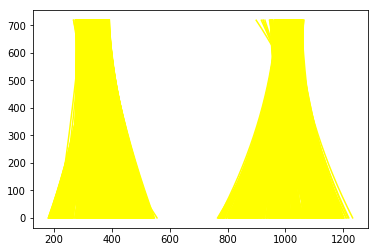

In [37]:
'''
nx = 9 
ny = 6
ret, mtx, dist, rvecs, tvecs = getCameraCalibrationCoefficients('camera_cal/calibration*.jpg', nx, ny)

src = np.float32([[580, 460], [700, 460], [1096, 720], [200, 720]])
dst = np.float32([[300, 0], [950, 0], [950, 720], [300, 720]])
'''

dist_pickle = pickle.load( open( "camera_cal/wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

video_input = 'project_video.mp4'
video_output = 'project_result_video.mp4'

cap = cv2.VideoCapture(video_input)

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(video_output, fourcc, 20.0, (1280, 720))

detected = False
left_fit = []
right_fit = []
ploty = []
i=0
while(True):
    ret, image = cap.read()
    #print(ret)
    if ret:
        i=i+1
        print(i)
        undistort_image = img_undistort(image, mtx, dist)
        #color_result_img,combined_binary_img = pipeline(undistort_image)
        #top_down_warped_img,Minv = warper(combined_binary_img)
        top_down_warped,Minv = warper(undistort_image)
        color_result_img,combined_binary_img = pipeline(top_down_warped)
        '''
        warp_image, M, Minv = warpImage(undistort_image, src, dst)
        hlsL_binary = hlsLSelect(warp_image)
        labB_binary = labBSelect(warp_image, (205, 255))
        combined_binary = np.zeros_like(sx_binary)
        combined_binary[(hlsL_binary == 1) | (labB_binary == 0)] = 1
        '''
        #print('detected = ',detected)
        #left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = fit_polynomial(combined_binary_img)
        
        if detected == False:
            left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = fit_polynomial(combined_binary_img)
            #out_img, left_fit, right_fit, ploty = fit_polynomial(combined_binary, nwindows=9, margin=80, minpix=40)
            #print(len(right_fit))
            #print(len(right_fit)>0 and len(left_fit)>0)
            print('k')
            if (len(left_fit_warped) > 0 and len(right_fit_warped) > 0) :
                detected = True
            else :
                #print('1')
                detected = False
        else:            
            left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = search_around_poly(left_fit_warped,right_fit_warped,combined_binary_img)
            #track_result, left_fit, right_fit, ploty,  = search_around_poly(combined_binary, left_fit, right_fit)
            print('l')
            #print(left_fit_warped)
            #print(right_fit_warped)
            if (len(left_fit_warped) > 0 and len(right_fit_warped) > 0) :
                detected = True
            else :
                detected = False
        
        left_curverad, right_curverad , curve_direction, distance_real = measure_curvature_real()
        #result = drawing(undistort_image, combined_binary, warp_image, left_fitx, right_fitx)
        draw_result = drawing(undistort_image , combined_binary_img,Minv, left_fitx, right_fitx, ploty)
        output_result = putimg(draw_result, curve_direction, distance_real)
        out.write(output_result)
    else:
        break
        
cap.release()
out.release()

1
[-6.47859555e-04  3.42364334e-01  4.49012964e+02]
[ 1.79144208e-04 -2.10889580e-01  1.02275596e+03]
k
2
[ 2.31629849e-04 -7.20106277e-01  7.64546633e+02]
[ 4.02121047e-04 -4.32629572e-01  1.07428598e+03]
l
3
[ 1.15432133e-04 -5.79091916e-01  7.23961327e+02]
[ 5.54105985e-04 -5.92268725e-01  1.11275320e+03]
l
4
[ 1.16775093e-04 -5.80274699e-01  7.23641269e+02]
[ 5.76939248e-04 -6.22933734e-01  1.12365484e+03]
l
5
[-1.05193329e-04 -3.13950068e-01  6.47450057e+02]
[ 5.72279315e-04 -6.32947898e-01  1.12939108e+03]
l
6
[-6.41144192e-05 -3.57434620e-01  6.60214449e+02]
[ 5.02715179e-04 -5.80958223e-01  1.12360944e+03]
l
7
[ 3.68718597e-04 -9.14977275e-01  8.39907701e+02]
[ 5.30850380e-04 -6.20335579e-01  1.13623354e+03]
l
8
[ 1.22098583e-04 -6.46606423e-01  7.70152418e+02]
[ 5.47742316e-04 -6.29739405e-01  1.13722326e+03]
l
9
[ 8.44903237e-05 -6.16472357e-01  7.68757652e+02]
[ 5.62447017e-04 -6.42513356e-01  1.13990384e+03]
l
10
[-2.14913509e-05 -5.05720837e-01  7.42773360e+02]
[ 5.9168893

[ 1.93207224e-04 -7.00859277e-01  9.81471381e+02]
[ 5.48034459e-04 -8.58291589e-01  1.21680904e+03]
l
81
[ 1.49677673e-04 -6.49775870e-01  9.69887464e+02]
[ 5.56583064e-04 -8.62234975e-01  1.21728232e+03]
l
82
[ 3.32455147e-05 -5.03234039e-01  9.26378392e+02]
[ 4.90412734e-04 -8.04341668e-01  1.21153968e+03]
l
83
[ 3.71857537e-05 -4.99872225e-01  9.25193531e+02]
[ 4.87911402e-04 -8.00872823e-01  1.21264173e+03]
l
84
[ 1.71294014e-04 -6.38454313e-01  9.62279716e+02]
[ 4.88280941e-04 -8.02189170e-01  1.21531993e+03]
l
85
[ 2.45152395e-04 -7.03400492e-01  9.77540053e+02]
[ 4.89053464e-04 -8.00628721e-01  1.21467017e+03]
l
86
[ 2.88207436e-04 -7.38524723e-01  9.85344169e+02]
[ 4.88027078e-04 -7.94289488e-01  1.21293936e+03]
l
87
[ 3.00644053e-04 -7.51933987e-01  9.90888934e+02]
[ 4.90578201e-04 -7.91554209e-01  1.20929783e+03]
l
88
[ 2.82949431e-04 -7.31120546e-01  9.86820744e+02]
[ 5.14610822e-04 -8.07511406e-01  1.21041468e+03]
l
89
[ 3.10864609e-04 -7.51085663e-01  9.90163069e+02]
[ 5.0

158
[ 4.37607166e-04 -7.33964351e-01  9.42030527e+02]
[ 4.17987611e-04 -5.66066894e-01  1.10898130e+03]
l
159
[ 2.93533252e-04 -5.88557256e-01  9.06911981e+02]
[ 4.00445013e-04 -5.52655463e-01  1.10835731e+03]
l
160
[ 3.85615857e-04 -6.93772876e-01  9.35716609e+02]
[ 4.00574286e-04 -5.54223004e-01  1.10852975e+03]
l
161
[ 2.56948085e-04 -5.60786835e-01  9.02566167e+02]
[ 4.18463036e-04 -5.60936658e-01  1.10872704e+03]
l
162
[ 2.53725461e-04 -5.59335262e-01  9.02522746e+02]
[ 4.14021410e-04 -5.57661386e-01  1.10654302e+03]
l
163
[ 2.37524171e-04 -5.44682764e-01  8.99287119e+02]
[ 4.29682785e-04 -5.69055084e-01  1.10657566e+03]
l
164
[ 2.23713220e-04 -5.30043845e-01  8.94998543e+02]
[ 4.14224801e-04 -5.55760106e-01  1.10516097e+03]
l
165
[ 2.25329005e-04 -5.29732767e-01  8.94401550e+02]
[ 4.18869942e-04 -5.59905623e-01  1.10395110e+03]
l
166
[ 2.25054139e-04 -5.26235903e-01  8.92825738e+02]
[ 4.29256050e-04 -5.67573772e-01  1.10352775e+03]
l
167
[ 1.86714342e-04 -4.82120005e-01  8.807155

[ 2.74240306e-04 -5.75830915e-01  8.99651412e+02]
[ 4.32779826e-04 -5.62893891e-01  1.08684572e+03]
l
237
[ 3.33707187e-04 -6.38239907e-01  9.16033989e+02]
[ 4.86674592e-04 -6.11284487e-01  1.09025483e+03]
l
238
[ 4.18746849e-04 -7.19859762e-01  9.34945180e+02]
[ 4.73850001e-04 -5.99280569e-01  1.08640997e+03]
l
239
[ 3.34777771e-04 -6.44170502e-01  9.19431461e+02]
[ 4.47891515e-04 -5.73333294e-01  1.07877937e+03]
l
240
[ 3.49274972e-04 -6.54847163e-01  9.21206383e+02]
[ 4.25868974e-04 -5.50745912e-01  1.07424014e+03]
l
241
[ 3.78398262e-04 -6.84688073e-01  9.28267087e+02]
[ 4.32163183e-04 -5.63278377e-01  1.07963997e+03]
l
242
[ 3.72564440e-04 -6.72438943e-01  9.23615565e+02]
[ 4.31105763e-04 -5.64231763e-01  1.08508300e+03]
l
243
[ 3.49792399e-04 -6.47716598e-01  9.17649748e+02]
[ 4.84267294e-04 -5.88610472e-01  1.08589371e+03]
l
244
[ 3.51553380e-04 -6.46015402e-01  9.16524357e+02]
[ 4.91017134e-04 -6.01708569e-01  1.09346736e+03]
l
245
[ 3.52117990e-04 -6.46581210e-01  9.16764649e+

[ 1.79667826e-04 -4.51113154e-01  8.63824275e+02]
[ 1.31270340e-04 -2.72409141e-01  1.02286697e+03]
l
315
[ 1.37073224e-04 -3.99365757e-01  8.48861153e+02]
[ 1.31265107e-04 -2.60310603e-01  1.01614025e+03]
l
316
[ 1.25850930e-04 -3.82577150e-01  8.42970085e+02]
[ 1.40358132e-04 -2.55675114e-01  1.00914572e+03]
l
317
[ 1.02967152e-04 -3.51802440e-01  8.32986105e+02]
[ 1.31544729e-04 -2.39723760e-01  1.00308496e+03]
l
318
[ 2.07762965e-04 -4.67813762e-01  8.64270310e+02]
[ 1.55998916e-04 -2.57686506e-01  1.00366222e+03]
l
319
[ 1.93959592e-04 -4.43694259e-01  8.54963132e+02]
[ 1.45778509e-04 -2.43426788e-01  1.00058203e+03]
l
320
[ 1.76337950e-04 -4.23866237e-01  8.49673744e+02]
[ 1.33206116e-04 -2.34791556e-01  1.00235076e+03]
l
321
[ 1.98085700e-04 -4.34375309e-01  8.48053827e+02]
[ 1.27556040e-04 -2.23763952e-01  9.98845847e+02]
l
322
[ 1.95505778e-04 -4.32217592e-01  8.48004425e+02]
[ 1.52242770e-04 -2.36785690e-01  9.96570055e+02]
l
323
[ 1.80403838e-04 -4.17679123e-01  8.44546576e+

[-5.91801409e-05 -3.30128858e-02  6.43915246e+02]
[ 2.14139983e-04 -2.32021593e-01  9.47076305e+02]
l
393
[-5.40479839e-05 -3.79605863e-02  6.44202830e+02]
[ 1.67115728e-04 -1.89034179e-01  9.38722690e+02]
l
394
[-2.24155785e-05 -7.56151570e-02  6.53901214e+02]
[ 1.31128688e-04 -1.66444402e-01  9.40002315e+02]
l
395
[ 8.72681528e-06 -1.01415492e-01  6.57289905e+02]
[ 1.41976093e-04 -1.75714474e-01  9.40586825e+02]
l
396
[ 2.77148442e-05 -1.19036049e-01  6.59575806e+02]
[ 1.01774077e-04 -1.59227314e-01  9.45642644e+02]
l
397
[ 2.39096773e-05 -1.20347985e-01  6.60566364e+02]
[ 4.55781216e-05 -1.11520674e-01  9.36211874e+02]
l
398
[ 5.93142728e-05 -1.54575597e-01  6.67277717e+02]
[ 3.69924653e-05 -9.81977662e-02  9.32515090e+02]
l
399
[ 1.53188538e-05 -1.19276361e-01  6.60947648e+02]
[ 5.03283303e-05 -9.13199673e-02  9.21832848e+02]
l
400
[ 6.53005012e-05 -1.67824041e-01  6.71175733e+02]
[ 3.20031585e-05 -8.42400346e-02  9.25467469e+02]
l
401
[ 1.35794046e-05 -1.22003571e-01  6.60003085e+

[-1.15988220e-03  1.19591592e+00  1.19458634e+02]
[ 5.53477574e-03 -6.34394491e+00  2.77649614e+03]
l
472
[-9.21901511e-04  9.84694892e-01  1.54163679e+02]
[ 9.14432462e-03 -1.08784024e+01  4.19408861e+03]
l
473
[-6.82268254e-04  7.53520310e-01  2.00347934e+02]
[ 1.48685474e-02 -1.84147833e+01  6.66294018e+03]
l
474
[-3.63436521e-03  4.62438302e+00 -1.06834868e+03]
[ 2.41899077e-02 -3.10302253e+01  1.09124962e+04]
l
475
[-4.21535805e-03  5.15022155e+00 -1.16486771e+03]
[ 3.73360036e-02 -4.89327227e+01  1.69956633e+04]
l
476
[-4.48196948e-03  5.51239791e+00 -1.28894285e+03]
[ 3.71587295e-02 -4.89317561e+01  1.70744368e+04]
l
477
[-4.60578110e-03  5.67988028e+00 -1.34529209e+03]
[ 3.67714723e-02 -4.87117715e+01  1.71006894e+04]
l
478
[-4.39644313e-03  5.53707023e+00 -1.34327792e+03]
[ 2.62565568e-02 -3.53391039e+01  1.28911633e+04]
l
479
[-4.57189836e-03  5.82733066e+00 -1.45996656e+03]
[ 2.07349980e-02 -2.81122829e+01  1.05620936e+04]
l
480
[-4.56901733e-03  5.79570921e+00 -1.43977928e+

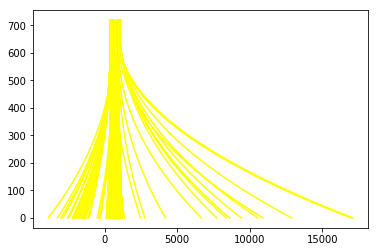

In [130]:
'''
nx = 9 
ny = 6
ret, mtx, dist, rvecs, tvecs = getCameraCalibrationCoefficients('camera_cal/calibration*.jpg', nx, ny)

src = np.float32([[580, 460], [700, 460], [1096, 720], [200, 720]])
dst = np.float32([[300, 0], [950, 0], [950, 720], [300, 720]])
'''

dist_pickle = pickle.load( open( "camera_cal/wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

video_input = 'challenge_video.mp4'
video_output = 'result_challenge_video1.mp4'

cap = cv2.VideoCapture(video_input)

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(video_output, fourcc, 20.0, (1280, 720))

detected = False
left_fit = []
right_fit = []
ploty = []
i=0
while(True):
    ret, image = cap.read()
    #print(ret)
    if ret:
        i=i+1
        print(i)
        undistort_image = img_undistort(image, mtx, dist)
        #color_result_img,combined_binary_img = pipeline(undistort_image)
        #top_down_warped_img,Minv = warper(combined_binary_img)
        top_down_warped,Minv = warper(undistort_image)
        color_result_img,combined_binary_img = pipeline(top_down_warped)
        '''
        warp_image, M, Minv = warpImage(undistort_image, src, dst)
        hlsL_binary = hlsLSelect(warp_image)
        labB_binary = labBSelect(warp_image, (205, 255))
        combined_binary = np.zeros_like(sx_binary)
        combined_binary[(hlsL_binary == 1) | (labB_binary == 0)] = 1
        '''
        #print('detected = ',detected)
        #left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = fit_polynomial(combined_binary_img)
        
        if detected == False:
            left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = fit_polynomial(combined_binary_img)
            #out_img, left_fit, right_fit, ploty = fit_polynomial(combined_binary, nwindows=9, margin=80, minpix=40)
            #print(len(right_fit))
            #print(len(right_fit)>0 and len(left_fit)>0)
            print('k')
            if (len(left_fit_warped) > 0 and len(right_fit_warped) > 0) :
                detected = True
            else :
                #print('1')
                detected = False
        else:            
            left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = search_around_poly(left_fit_warped,right_fit_warped,combined_binary_img)
            #track_result, left_fit, right_fit, ploty,  = search_around_poly(combined_binary, left_fit, right_fit)
            print('l')
            #print(left_fit_warped)
            #print(right_fit_warped)
            if (len(left_fit_warped) > 0 and len(right_fit_warped) > 0) :
                detected = True
            else :
                detected = False
        
        #result = drawing(undistort_image, combined_binary, warp_image, left_fitx, right_fitx)
        draw_result = drawing(undistort_image , combined_binary_img,Minv, left_fitx, right_fitx, ploty)
        out.write(draw_result)
    else:
        break
        
cap.release()
out.release()

1
[-4.74353593e-04  6.66124519e-01  5.65575286e+01]
[-6.48640888e-04  7.55553262e-01  6.81672599e+02]
2
[-4.35426388e-04  6.44328208e-01  5.05178054e+01]
[-6.83173044e-04  7.59380208e-01  6.96117221e+02]
3
[-3.97257571e-04  6.18271676e-01  4.90881584e+01]
[-6.70628002e-04  7.41237237e-01  7.04702150e+02]
4
[-3.70718655e-04  6.03134859e-01  4.67330361e+01]
[-6.65278354e-04  7.37559477e-01  7.05604689e+02]
5
[-3.80901319e-04  6.22802006e-01  3.71310683e+01]
[-6.69224329e-04  7.47891572e-01  7.01347838e+02]
6
[-3.80725114e-04  6.33209594e-01  3.02233900e+01]
[-6.81522010e-04  7.64058165e-01  6.95735184e+02]
7
[-3.80417089e-04  6.38385784e-01  2.80457285e+01]
[-7.06643769e-04  8.10639748e-01  6.75709252e+02]
8
[-4.00199351e-04  6.55810554e-01  2.77388073e+01]
[-6.81337718e-04  8.34662666e-01  6.48540253e+02]
9
[-4.55638210e-04  7.12616396e-01  1.56225266e+01]
[-7.59736504e-04  9.46506543e-01  6.06024519e+02]
10
[-4.39648597e-04  7.01875842e-01  1.62494082e+01]
[-6.29070792e-04  8.45542392e

[ 8.21708916e-04 -6.49475230e-01  3.25052192e+02]
[ 4.63808019e-04 -1.76074209e-01  8.56735156e+02]
84
[ 9.23917631e-04 -7.14837923e-01  3.31496943e+02]
[ 4.11174058e-04 -1.74492869e-01  8.78050116e+02]
85
[ 1.01204149e-03 -7.99486532e-01  3.50578811e+02]
[ 3.42615718e-04 -1.61049609e-01  8.98548396e+02]
86
[ 6.62062304e-05 -1.12465683e-03  2.04057242e+02]
[ 3.81201449e-04 -2.32200365e-01  9.30653142e+02]
87
[ 5.50853052e-04 -3.16919676e-01  1.38722716e+02]
[2.52117259e-04 7.72950957e-02 7.81032583e+02]
88
[-1.27450986e-04  1.88132350e-01  2.55746096e+02]
[ 6.90490554e-04 -3.26578041e-01  8.54428579e+02]
89
[-2.99493235e-04  2.89583701e-01  2.64264395e+02]
[ 3.61630564e-04 -7.50735469e-02  8.26539189e+02]
90
[-2.18755276e-04  2.40749626e-01  2.58484038e+02]
[-2.29699714e-05  4.65663078e-02  9.11629616e+02]
91
[1.50402001e-05 3.74454565e-02 2.87623125e+02]
[ 2.51306650e-04 -7.98364603e-02  8.72976705e+02]
92
[2.73208317e-05 2.10992370e-02 2.84863502e+02]
[ 2.58615995e-04 -1.01789717e-01

[ 1.16836978e-03 -2.19436326e+00  1.29034109e+03]
[ 1.08719116e-02 -1.38195301e+01  5.54994777e+03]
164
[-2.08108129e-03  1.95434631e+00 -3.56243208e+01]
[ 1.19595606e-02 -1.53830235e+01  6.08935087e+03]
165
[-1.87098234e-03  1.67735561e+00  5.41959068e+01]
[ 1.37698736e-02 -1.65147359e+01  6.16786252e+03]
166
[ 5.63220805e-03 -7.60101513e+00  2.93744260e+03]
[ 1.27692401e-02 -1.54692477e+01  5.89668517e+03]
167
[ 4.98516358e-03 -6.86167378e+00  2.72792493e+03]
[ 9.09072091e-03 -1.12692765e+01  4.69390580e+03]
168
[-1.53196422e-03  1.25356388e+00  1.81938872e+02]
[ 1.01302687e-02 -1.26069602e+01  5.11607384e+03]
169
[-3.68138554e-04 -2.82834977e-01  6.87434849e+02]
[ 1.72025640e-02 -2.14015593e+01  7.83131291e+03]
170
[ 4.74133866e-03 -6.48756205e+00  2.58931964e+03]
[ 1.74954180e-02 -2.19877336e+01  8.07192109e+03]
171
[ 7.67633267e-03 -9.79552792e+00  3.53292630e+03]
[ 1.74508982e-02 -2.22385771e+01  8.23267412e+03]
172
[ 4.84227142e-03 -6.75892628e+00  2.72307100e+03]
[ 1.77499367e-

[ 9.53253351e-04 -6.12029891e-01  2.71560189e+02]
[2.15569324e-05 2.67270663e-02 8.88810267e+02]
243
[-1.32151403e-03  2.31623662e+00 -6.68744862e+02]
[1.02883861e-05 2.98468754e-02 8.97270393e+02]
244
[-9.85823898e-04  1.91171098e+00 -5.49171731e+02]
[ 1.15275096e-04 -8.21072871e-02  9.24071965e+02]
245
[ 2.22235295e-04 -1.81554494e-01  6.98896139e+02]
[ 1.31003246e-04 -1.05398416e-01  9.42513261e+02]
246
[-6.75115917e-04  1.54988013e+00 -4.47541507e+02]
[-3.45302903e-04  4.02855220e-01  8.19399469e+02]
247
[4.53376567e-04 7.91413629e-02 2.94320890e+01]
[-2.76979678e-04  3.19960509e-01  8.41279913e+02]
248
[-3.17666973e-04  1.12492135e+00 -3.23129530e+02]
[-1.85300060e-04  2.17153853e-01  8.77833220e+02]
249
[ 8.25410200e-04 -3.59525929e-01  1.58488977e+02]
[-4.39621639e-05  7.82920216e-02  9.02063135e+02]
250
[ 7.29340507e-04 -2.81073785e-01  1.49349968e+02]
[ 3.07446236e-05 -1.77934166e-02  9.36766130e+02]
251
[ 7.69232342e-04 -3.68218146e-01  1.91116597e+02]
[ 1.32675149e-04 -7.862

323
[ 8.82927772e-04 -1.38595997e+00  9.01513472e+02]
[-3.45983555e-04  5.49975021e-03  1.05546481e+03]
324
[ 8.79546808e-04 -1.40245481e+00  9.17190413e+02]
[-4.08101544e-04  6.37344034e-02  1.04453830e+03]
325
[ 6.97839575e-04 -1.23834380e+00  8.91634595e+02]
[-4.11658125e-04  9.42917342e-02  1.02973833e+03]
326
[ 3.50204268e-04 -8.20455928e-01  7.69274193e+02]
[-1.74673462e-04  3.05704409e-02  9.82832363e+02]
327
[ 8.64337234e-04 -1.41995161e+00  9.46162337e+02]
[-4.64232886e-04  1.62649411e-01  1.01152735e+03]
328
[ 6.52438685e-04 -1.17688256e+00  8.78563723e+02]
[-3.50202663e-04  7.82241225e-02  1.02305811e+03]
329
[ 9.87993930e-06 -2.08559459e-01  5.16882565e+02]
[-3.30941651e-04  9.14935956e-02  1.00886511e+03]
330
[-2.12623852e-04 -5.77262244e-02  5.21747489e+02]
[-1.59650716e-04  1.86394609e-01  1.12659386e+03]
331
[-8.79245050e-04  6.94695586e-01  3.20358634e+02]
[ 5.31370052e-05 -3.28766872e-02  1.18502095e+03]
332
[-9.68314643e-04  8.06694439e-01  2.87119165e+02]
[ 7.177069

[ 1.04456653e-04 -1.05631369e-02  2.62385475e+02]
[-1.84269158e-04  1.96369600e-01  1.07971580e+03]
403
[1.28944797e-04 8.40837902e-03 2.28058838e+02]
[-2.05784585e-04  2.18646648e-01  1.09742029e+03]
404
[9.30524330e-05 5.04562516e-03 2.26023899e+02]
[-2.07883107e-04  2.19916643e-01  1.09854919e+03]
405
[6.87134715e-05 5.23915841e-03 2.23208730e+02]
[-2.21327982e-04  2.34173885e-01  1.10144245e+03]
406
[5.16241333e-05 4.73325066e-03 2.22642088e+02]
[-1.68799571e-04  1.64457537e-01  1.02509923e+03]
407
[ 9.82228202e-05 -1.19026771e-02  2.28206176e+02]
[-1.38778648e-04  1.38297404e-01  1.03547667e+03]
408
[8.08412279e-05 1.65719558e-02 2.14490471e+02]
[-1.41484990e-04  1.38628093e-01  1.04583487e+03]
409
[ 1.53601908e-04 -1.50999948e-02  2.04922642e+02]
[-9.93899309e-05  1.01549204e-01  1.05525475e+03]
410
[1.68405579e-04 7.72549978e-03 1.64107917e+02]
[-6.02946735e-05  6.81654098e-02  1.06638677e+03]
411
[2.07449932e-04 1.33150413e-02 1.44692642e+02]
[-3.18983842e-05  4.31651892e-02  1

482
[-3.36621844e-03  3.66752377e+00 -3.07446860e+02]
[-3.63812443e-03  4.03425426e+00 -4.09376326e+02]
483
[-3.33699266e-03  3.63677916e+00 -2.97599807e+02]
[-3.43762443e-03  3.76840918e+00 -3.33241637e+02]
484
[-3.14964487e-03  3.41529817e+00 -2.36529981e+02]
[-3.31370878e-03  3.63299284e+00 -2.95826000e+02]
485
[-3.10523007e-03  3.36365718e+00 -2.18266442e+02]
[-6.43392038e-04  7.41541239e-01  1.01997656e+03]
486
[-3.10368743e-03  3.33812096e+00 -2.07367868e+02]
[-6.66935506e-04  7.82831093e-01  1.01589235e+03]
487
[-3.07903536e-03  3.33562396e+00 -2.08772660e+02]
[-6.57993857e-04  7.93627932e-01  1.01648023e+03]
488
[-2.94665049e-03  3.18980379e+00 -1.70987719e+02]
[-5.55654282e-04  7.32528006e-01  1.02925059e+03]
489
[-2.98291554e-03  3.23078335e+00 -1.79279694e+02]
[-4.75089381e-04  6.77313872e-01  1.04322966e+03]
490
[-2.85155255e-03  3.02626958e+00 -1.22940236e+02]
[-2.73225230e-04  5.56311662e-01  1.05644878e+03]
491
[-5.36169361e-03  7.26607389e+00 -2.31202527e+03]
[-5.977816

[-1.15053009e-03  1.49750570e+00 -1.84732710e+02]
[-1.27552778e-04  3.18470768e-01  7.60258304e+02]
562
[-1.05770742e-03  1.37498488e+00 -1.42076951e+02]
[-1.26285863e-04  3.00941825e-01  7.72610120e+02]
563
[-1.02086022e-03  1.30806025e+00 -1.09131232e+02]
[-1.31736418e-04  3.04126729e-01  7.72796897e+02]
564
[-8.97441294e-04  1.13613523e+00 -4.50254643e+01]
[-1.27029914e-04  2.99800943e-01  7.73896982e+02]
565
[-9.21555016e-04  1.16130460e+00 -4.76734069e+01]
[-1.34908566e-04  3.09642707e-01  7.70367869e+02]
566
[-1.86852051e-03  2.46351770e+00 -4.92169769e+02]
[-1.35597228e-04  2.90834962e-01  7.85515578e+02]
567
[-3.51323182e-04  5.02162214e-01  1.38134031e+02]
[-1.28128461e-04  2.63991890e-01  8.03765498e+02]
568
[-6.02698011e-04  8.60498112e-01  1.22527875e+01]
[-1.39889628e-04  2.46170706e-01  8.24970623e+02]
569
[-4.20728720e-04  6.21134930e-01  8.86917831e+01]
[-1.35358371e-04  2.09590261e-01  8.52120698e+02]
570
[ 1.93609175e-03 -2.41513437e+00  1.05321877e+03]
[-1.13256236e-

/home/ubuntu_pgl/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:96: RankWarning: Polyfit may be poorly conditioned


[3.33928453e-04 2.37089202e-01 1.68333333e+02]
[ 1.94915352e-04 -4.74914345e-02  8.90379150e+02]
593
[ 2.16418324e-03 -2.90897561e+00  1.59026056e+03]
[ 3.85951383e-04 -2.09673716e-01  9.13053246e+02]
594
[ 1.14972804e-03 -1.49478477e+00  1.08146678e+03]
[ 3.87685251e-04 -2.27492487e-01  9.30580005e+02]
595
[ 1.12052940e-03 -1.48872157e+00  1.09090248e+03]
[ 4.19332232e-04 -2.63786233e-01  9.42575035e+02]
596
[ 1.10978371e-03 -1.48152450e+00  1.08967431e+03]
[-6.80756991e-04  8.61885284e-01  3.76578890e+02]
597
[ 2.23057658e-03 -2.86331438e+00  1.51652841e+03]
[ 7.80052101e-05 -9.97664046e-02  6.86702528e+02]
598
[ 2.18338259e-03 -2.85022245e+00  1.52705732e+03]
[-1.19437882e-03  1.54191260e+00  1.52166047e+02]
599
[ 1.79111470e-03 -2.33414060e+00  1.35555468e+03]
[-1.14802371e-04  1.24299156e-01  5.92858587e+02]
600
[ 1.98878358e-03 -2.55689092e+00  1.41763803e+03]
[-7.17826081e-04  9.12035084e-01  3.65948239e+02]
601
[-3.95544478e-04  5.07909579e-01  1.75801888e+02]
[ 4.98825709e-04 

[ 5.83823528e-05 -5.76012347e-02  5.28949316e+02]
[-3.15603859e-04  3.36535148e-01  8.57709307e+02]
672
[ 1.20768143e-04 -1.34570802e-01  5.61192041e+02]
[-1.90464004e-04  2.16226699e-01  8.65393023e+02]
673
[ 1.55045689e-04 -1.77957029e-01  5.68877241e+02]
[ 1.43872625e-04 -1.44424348e-01  8.07387743e+02]
674
[ 2.63312187e-04 -2.90633398e-01  6.48162966e+02]
[ 2.99808911e-04 -3.26153018e-01  8.03974661e+02]
675
[ 2.46255877e-04 -2.68537623e-01  6.60132126e+02]
[ 1.41620953e-04 -1.59080210e-01  7.41102015e+02]
676
[ 5.49705101e-04 -6.22673159e-01  7.64364581e+02]
[-3.40974830e-04  3.92249949e-01  7.94954809e+02]
677
[ 5.37662580e-04 -6.16956563e-01  7.54750313e+02]
[-1.70923906e-04  2.10634264e-01  7.35992633e+02]
678
[ 2.13996559e-04 -2.55041774e-01  7.04647654e+02]
[ 4.36670857e-04 -4.77326283e-01  1.10578978e+03]
679
[ 4.08331861e-04 -5.11813579e-01  7.62768490e+02]
[ 6.37339306e-04 -7.32500096e-01  1.17549998e+03]
680
[ 7.12073750e-04 -8.79609186e-01  8.86225420e+02]
[3.25423998e-0

750
[ 2.32828489e-03 -2.55216227e+00  9.84203680e+02]
[-6.39877122e-04  9.96995640e-01  5.27529720e+02]
751
[ 2.32925494e-03 -2.57286889e+00  9.94290813e+02]
[-9.52486206e-04  1.35364723e+00  4.26679187e+02]
752
[ 2.90591230e-03 -3.39023827e+00  1.27943393e+03]
[-6.05976670e-04  1.02976145e+00  4.93092810e+02]
753
[ 2.65936463e-04 -1.64986952e-01  2.93339210e+02]
[-2.15239341e-04  6.20255860e-01  5.93840366e+02]
754
[ 3.67006165e-04 -2.40609868e-01  3.02411199e+02]
[-6.77769000e-04  1.12181277e+00  4.54977917e+02]
755
[ 9.41211785e-05 -3.00922748e-02  2.84002723e+02]
[2.07519562e-04 1.26901909e-01 7.21051451e+02]
756
[ 5.34219326e-04 -2.91968675e-02  8.55989784e+01]
[3.33306045e-04 5.17836105e-02 7.16294981e+02]
757
[ 2.11790724e-05 -2.35693636e-03  2.98005322e+02]
[ 4.22180019e-04 -7.83961369e-02  7.60627541e+02]
758
[ 6.12291292e-05 -3.97981991e-02  3.05038294e+02]
[ 3.97033729e-04 -4.62098406e-02  7.47051048e+02]
759
[ 6.49037277e-04 -3.12750073e-01  2.28660280e+02]
[ 3.61113084e-04

[ 2.01622877e-03 -3.14793767e+00  1.61635197e+03]
[ 1.30029732e-04 -5.99696068e-02  1.23240550e+03]
831
[-8.36184203e-04  5.14961587e-01  4.42629457e+02]
[ 8.30051642e-05 -2.54132957e-02  1.22915962e+03]
832
[-7.34589327e-04  4.74016832e-01  4.26532285e+02]
[ 1.15974348e-04 -5.32674021e-02  1.23383177e+03]
833
[-9.49064723e-04  6.68572088e-01  3.92793332e+02]
[ 1.19563719e-04 -8.75855759e-02  1.24199947e+03]
834
[-3.10210191e-04 -1.83419856e-01  6.76792814e+02]
[ 1.78206561e-04 -1.20841879e-01  1.24285076e+03]
835
[ 4.28113702e-05 -6.03103836e-01  7.98442781e+02]
[ 1.16121377e-04 -7.58651169e-02  1.22440542e+03]
836
[ 2.47404988e-03 -3.55251433e+00  1.67677771e+03]
[ 1.53202826e-04 -8.48829090e-02  1.21926884e+03]
837
[ 1.93125832e-03 -2.83314291e+00  1.44497745e+03]
[ 1.58659692e-04 -1.14126807e-01  1.23348733e+03]
838
[-2.26946332e-04  1.00072431e-02  5.14266765e+02]
[ 2.17839409e-04 -1.39822050e-01  1.24327270e+03]
839
[-4.67940347e-04  2.70227053e-01  4.51243988e+02]
[ 1.47696894e-

[-3.67479515e-03  4.76362398e+00 -1.20812265e+03]
[ 4.84331331e-04 -8.23014835e-01  1.30874164e+03]
911
[-2.99963536e-03  3.92426325e+00 -9.46632788e+02]
[ 5.30966371e-04 -8.42624206e-01  1.30297593e+03]
912
[ 5.91215373e-05 -6.16550105e-02  3.47082666e+02]
[ 5.42328176e-04 -8.32852038e-01  1.29134357e+03]
913
[-2.71955549e-05  6.08456125e-02  5.92365631e+02]
[ 8.10340049e-04 -1.13399449e+00  1.37105046e+03]
914
[-1.68363806e-04  2.36670993e-01  5.38628866e+02]
[ 6.66311677e-04 -9.66250178e-01  1.32027656e+03]
915
[-5.36867535e-05  8.44178369e-02  5.85266882e+02]
[-1.14953338e-03  1.55872941e+00  1.11892594e+02]
916
[ 4.25862116e-04 -5.42091590e-01  7.88808211e+02]
[-1.32937848e-03  1.79077536e+00  3.81211059e+01]
917
[ 1.56412390e-04 -1.99048383e-01  6.80237012e+02]
[-8.35447291e-04  1.13797048e+00  2.52926207e+02]
918
[ 3.27461042e-04 -4.21922405e-01  7.52308691e+02]
[-4.17900634e-04  6.46783195e-01  4.08316600e+02]
919
[ 4.11422997e-04 -5.31955824e-01  7.87709855e+02]
[-4.55574546e-

[-2.31930863e-02  2.80508201e+01 -7.88761087e+03]
[ 3.28628595e-02 -3.88335906e+01  1.22022469e+04]
990
[-2.83270711e-02  3.49934203e+01 -1.02265810e+04]
[ 2.42337024e-02 -2.88739806e+01  9.30778775e+03]
991
[-2.86198094e-02  3.59896248e+01 -1.07603761e+04]
[ 1.09690536e-03 -8.64347180e-01  8.01170651e+02]
992
[-4.14773527e-02  5.28695148e+01 -1.62925759e+04]
[ 1.63341201e-02 -2.02433399e+01  6.92815158e+03]
993
[-4.92556182e-02  6.38029482e+01 -2.01219277e+04]
[ 2.24613662e-03 -2.68077759e+00  1.43142908e+03]
994
[-6.18575829e-02  8.15055014e+01 -2.63296491e+04]
[ 1.02393963e-03 -6.47947631e-01  6.13178077e+02]
995
[-5.89225423e-02  7.85632793e+01 -2.56866430e+04]
[ 2.22246776e-03 -2.20378335e+00  1.09998492e+03]
996
[-6.32035886e-02  8.55115035e+01 -2.84442506e+04]
[ 7.13957924e-02 -1.00922984e+02  3.67845371e+04]
997
[-7.22077483e-02  9.89452901e+01 -3.34382787e+04]
[-5.43739097e-03  5.04381247e+00  2.75058506e+02]
998
[-2.02386306e-02  2.74060587e+01 -8.74845454e+03]
[-3.26755900e-

1068
[-5.67182269e-03  7.76501609e+00 -2.26095821e+03]
[ 4.89905741e-05 -9.01827548e-02  1.10075257e+03]
1069
[-4.38911782e-03  6.15722646e+00 -1.79913769e+03]
[ 2.42583695e-04 -4.03381747e-01  1.26999974e+03]
1070
[-4.63055487e-04  4.39765144e-01  5.64709726e+02]
[-2.30880949e-04  2.77259395e-01  1.15442599e+03]
1071
[-3.68595764e-04  3.84552586e-01  5.52634758e+02]
[-5.80087641e-04  6.08741333e-01  1.04886143e+03]
1072
[ 2.05253213e-05 -1.60512271e-01  7.33163297e+02]
[-5.53571968e-04  5.95381052e-01  9.79449214e+02]
1073
[ 6.88148409e-04 -1.14351826e+00  1.05068088e+03]
[ 3.33940171e-04 -4.05757182e-01  1.23444699e+03]
1074
[-3.47960650e-04  4.13560347e-01  5.15920748e+02]
[ 1.23471613e-04 -1.50837819e-01  1.09492645e+03]
1075
[ 3.53081551e-05 -2.71601626e-01  8.07528984e+02]
[-5.62419175e-05  1.40081313e-01  9.41697226e+02]
1076
[ 3.56424758e-04 -5.24540879e-01  8.29447159e+02]
[ 4.33779940e-05 -5.32563908e-02  9.73231818e+02]
1077
[-5.93101194e-04  6.65482532e-01  4.64038247e+02]


1147
[ 3.98309883e-04 -2.68022549e-01  1.22435099e+02]
[ 1.23164826e-03 -7.27023410e-01  7.99240075e+02]
1148
[ 3.14353292e-04 -1.98462519e-01  9.60915114e+01]
[ 8.68156603e-04 -5.65875716e-01  7.70554113e+02]
1149
[ 3.04052882e-04 -2.01901990e-01  8.66603602e+01]
[ 8.93830094e-04 -5.97706897e-01  7.62568279e+02]
1150
[-6.21505154e-05 -9.74135969e-02  1.12083337e+02]
[ 8.18539493e-04 -5.85345255e-01  7.51142051e+02]
1151
[-3.89334777e-04  1.04383999e-01  8.87680166e+01]
[ 9.57634532e-04 -6.86289959e-01  7.53961623e+02]
1152
[-9.22941611e-04  4.28359434e-01  5.44085872e+01]
[ 1.32410580e-03 -8.87599504e-01  7.57941591e+02]
1153
[ 1.47025273e-03 -9.89391855e-01  7.56132734e+02]
[ 9.49638298e-04 -6.26359822e-01  7.21304128e+02]
1154
[-1.27987588e-04  1.82622932e-01  2.94762045e+02]
[ 1.31185321e-03 -8.99772928e-01  7.58899984e+02]
1155
[-6.12194776e-04  4.91222227e-01  2.96737554e+02]
[ 1.35600681e-03 -9.36122251e-01  7.59765555e+02]
1156
[-4.24177948e-04  2.03091704e-01  1.90681251e+02]


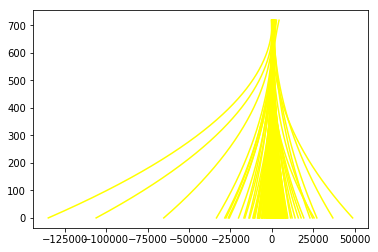

In [132]:
'''
nx = 9 
ny = 6
ret, mtx, dist, rvecs, tvecs = getCameraCalibrationCoefficients('camera_cal/calibration*.jpg', nx, ny)

src = np.float32([[580, 460], [700, 460], [1096, 720], [200, 720]])
dst = np.float32([[300, 0], [950, 0], [950, 720], [300, 720]])
'''

dist_pickle = pickle.load( open( "camera_cal/wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

video_input = 'harder_challenge_video.mp4'
video_output = 'result_harder_challenge_video1.mp4'

cap = cv2.VideoCapture(video_input)

fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter(video_output, fourcc, 20.0, (1280, 720))

detected = False
left_fit = []
right_fit = []
ploty = []
i=0
while(True):
    ret, image = cap.read()
    #print(ret)
    if ret:
        i=i+1
        print(i)
        undistort_image = img_undistort(image, mtx, dist)
        #color_result_img,combined_binary_img = pipeline(undistort_image)
        #top_down_warped_img,Minv = warper(combined_binary_img)
        top_down_warped,Minv = warper(undistort_image)
        color_result_img,combined_binary_img = pipeline(top_down_warped)
        '''
        warp_image, M, Minv = warpImage(undistort_image, src, dst)
        hlsL_binary = hlsLSelect(warp_image)
        labB_binary = labBSelect(warp_image, (205, 255))
        combined_binary = np.zeros_like(sx_binary)
        combined_binary[(hlsL_binary == 1) | (labB_binary == 0)] = 1
        '''
        #print('detected = ',detected)
        left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = fit_polynomial(combined_binary_img)
        '''
        if detected == False:
            left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = fit_polynomial(combined_binary_img)
            #out_img, left_fit, right_fit, ploty = fit_polynomial(combined_binary, nwindows=9, margin=80, minpix=40)
            #print(len(right_fit))
            #print(len(right_fit)>0 and len(left_fit)>0)
            print('k')
            if (len(left_fit_warped) > 0 and len(right_fit_warped) > 0) :
                detected = True
            else :
                #print('1')
                detected = False
        else:            
            left_fit_warped,right_fit_warped,warped_leftx, warped_lefty, warped_rightx, warped_righty,left_fitx, right_fitx,ploty,result = search_around_poly(left_fit_warped,right_fit_warped,combined_binary_img)
            #track_result, left_fit, right_fit, ploty,  = search_around_poly(combined_binary, left_fit, right_fit)
            print('l')
            #print(left_fit_warped)
            #print(right_fit_warped)
            if (len(left_fit_warped) > 0 and len(right_fit_warped) > 0) :
                detected = True
            else :
                detected = False
        '''
        #result = drawing(undistort_image, combined_binary, warp_image, left_fitx, right_fitx)
        draw_result = drawing(undistort_image , combined_binary_img,Minv, left_fitx, right_fitx, ploty)
        out.write(draw_result)
    else:
        break
        
cap.release()
out.release()

In [ ]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    color_image = np.copy(image)
    gray = grayscale(image)
    blur_gray = gaussian_blur(gray, 5)
    edges = canny(blur_gray, 40, 150)

    imshape = edges.shape
    vertices = np.array([[(0,imshape[0]),(imshape[1], imshape[0]), (imshape[1]/2, 310)]], dtype=np.int32)
    masked_image = region_of_interest(edges, vertices)
    
    left_line_xmin_last = None
    left_line_xmax_last = None
    right_line_xmin_last = None
    right_line_xmax_last = None
    line_y_max_last = None
    line_y_min_last = None
    
    line_edges = hough_lines(masked_image,rho=1,theta=np.pi/180,threshold=15,min_line_len=40,max_line_gap=20)
    line_image = weighted_img(color_image, line_edges, α=0.8, β=1., γ=0.)
    result = line_image
    return result

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  